In [1]:
from os import listdir
from astroquery.simbad import Simbad
import numpy as np
from astropy.io import fits

import matplotlib.pyplot as plt
plt.style.use('seaborn-v0_8')
# plt.style.use('seaborn-v0_8-colorblind')

import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 20)

# Examining our data files

## 14-10-2023

In [2]:
dir_14 = '/home/shoaib/APT/Final_Project/original_data/14_10_2023/'

### Sunset Biases

In [3]:
bias_paths_14 = sorted([dir_14 + f for f in listdir(dir_14) if 'bias' in f])

print(f'There are {len(bias_paths_14)} sunset bias files from 14-10-2023.')
bias_paths_14

There are 10 sunset bias files from 14-10-2023.


['/home/shoaib/APT/Final_Project/original_data/14_10_2023/biasZalaz-1.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/biasZalaz-10.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/biasZalaz-2.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/biasZalaz-3.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/biasZalaz-4.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/biasZalaz-5.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/biasZalaz-6.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/biasZalaz-7.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/biasZalaz-8.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/biasZalaz-9.fit']

In [4]:
with fits.open(bias_paths_14[0]) as hdul:
    hdul = hdul

hdul.info()

Filename: /home/shoaib/APT/Final_Project/original_data/14_10_2023/biasZalaz-1.fit
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      53   (2048, 2048)   int16 (rescales to uint16)   


In [5]:
hdul[0].header

SIMPLE  =                    T                                                  
BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     
NAXIS   =                    2 /number of axes                                  
NAXIS1  =                 2048 /fastest changing axis                           
NAXIS2  =                 2048 /next to fastest changing axis                   
BSCALE  =   1.0000000000000000 /physical = BZERO + BSCALE*array_value           
BZERO   =   32768.000000000000 /physical = BZERO + BSCALE*array_value           
DATE-OBS= '2023-10-14T16:25:27' /YYYY-MM-DDThh:mm:ss observation start, UT      
EXPTIME =  0.00000000000000000 /Exposure time in seconds                        
EXPOSURE=  0.00000000000000000 /Exposure time in seconds                        
SET-TEMP=  -60.000000000000000 /CCD temperature setpoint in C                   
CCD-TEMP=  -59.127998352050781 /CCD temperature at start of exposure in C       
XPIXSZ  =   13.5000000000000

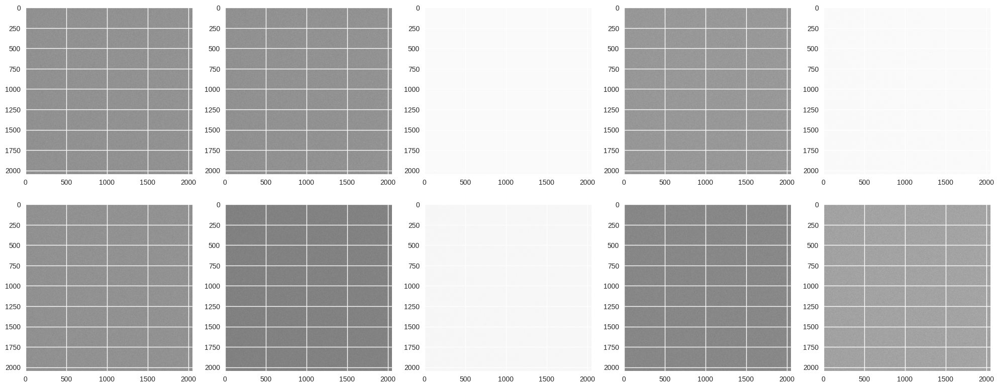

In [6]:
fig, axs = plt.subplots(2, 5, figsize=(5 * 4, 2 * 4))

for ax, path in zip(axs.flatten(), bias_paths_14):
    with fits.open(path) as hdul:
        data = hdul[0].data
    ax.imshow(data)

plt.tight_layout()
plt.show()

In [7]:
### Making a little table with the properties of the thing beside it

property_dict_list = []
for path in bias_paths_14:
    with fits.open(path) as hdul:
        property_dict = {}
        property_dict['IMAGETYP'] = hdul[0].header['IMAGETYP']
        # property_dict['FILTER'] = hdul[0].header['FILTER'] # no filter header available
        property_dict['EXPTIME'] = hdul[0].header['EXPTIME']
        property_dict['OBJCTRA'] = hdul[0].header['OBJCTRA']
        property_dict['OBJCTDEC'] = hdul[0].header['OBJCTDEC']
        property_dict['DATE-OBS'] = hdul[0].header['DATE-OBS']
        property_dict['JD-HELIO'] = hdul[0].header['JD-HELIO']
        property_dict['READOUTM'] = hdul[0].header['READOUTM']

    property_dict_list.append(property_dict)

pd.DataFrame(property_dict_list)

,IMAGETYP,EXPTIME,OBJCTRA,OBJCTDEC,DATE-OBS,JD-HELIO,READOUTM
0,BIAS,0.0,19 23 20,+38 05 39,2023-10-14T16:25:27,2.460232e+06,1MHz High Sensitivity 16-bit
1,BIAS,0.0,19 24 13,+38 05 38,2023-10-14T16:26:20,2.460232e+06,1MHz High Sensitivity 16-bit
2,BIAS,0.0,19 23 26,+38 05 39,2023-10-14T16:25:33,2.460232e+06,1MHz High Sensitivity 16-bit
3,BIAS,0.0,19 23 32,+38 05 39,2023-10-14T16:25:39,2.460232e+06,1MHz High Sensitivity 16-bit
4,BIAS,0.0,19 23 38,+38 05 39,2023-10-14T16:25:45,2.460232e+06,1MHz High Sensitivity 16-bit
5,BIAS,0.0,19 23 43,+38 05 39,2023-10-14T16:25:50,2.460232e+06,1MHz High Sensitivity 16-bit
6,BIAS,0.0,19 23 49,+38 05 38,2023-10-14T16:25:56,2.460232e+06,1MHz High Sensitivity 16-bit
7,BIAS,0.0,19 23 55,+38 05 38,2023-10-14T16:26:02,2.460232e+06,1MHz High Sensitivity 16-bit
8,BIAS,0.0,19 24 01,+38 05 38,2023-10-14T16:26:08,2.460232e+06,1MHz High Sensitivity 16-bit
9,BIAS,0.0,19 24 07,+38 05 38,2023-10-14T16:26:14,2.460232e+06,1MHz High Sensitivity 16-bit


### Sunset Flats 5s

In [8]:
flat_paths_14 = sorted([dir_14 + f for f in listdir(dir_14) if 'flat' in f])

print(f'There are {len(flat_paths_14)} sunset flat files in B, R, and V from 14-10-2023.')
flat_paths_14

There are 24 sunset flat files in B, R, and V from 14-10-2023.


['/home/shoaib/APT/Final_Project/original_data/14_10_2023/flatZalaz-5sec-1_B.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/flatZalaz-5sec-1_R.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/flatZalaz-5sec-1_V.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/flatZalaz-5sec-2_B.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/flatZalaz-5sec-2_R.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/flatZalaz-5sec-2_V.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/flatZalaz-5sec-3_B.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/flatZalaz-5sec-3_R.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/flatZalaz-5sec-3_V.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/flatZalaz-5sec-4_B.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/flatZalaz-5sec-4_R.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/flatZalaz-5sec-4_V.fit',
 '/h

In [9]:
with fits.open(flat_paths_14[0]) as hdul:
    hdul = hdul

hdul.info()

Filename: /home/shoaib/APT/Final_Project/original_data/14_10_2023/flatZalaz-5sec-1_B.fit
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      54   (2048, 2048)   int16 (rescales to uint16)   


In [10]:
hdul[0].header

SIMPLE  =                    T                                                  
BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     
NAXIS   =                    2 /number of axes                                  
NAXIS1  =                 2048 /fastest changing axis                           
NAXIS2  =                 2048 /next to fastest changing axis                   
BSCALE  =   1.0000000000000000 /physical = BZERO + BSCALE*array_value           
BZERO   =   32768.000000000000 /physical = BZERO + BSCALE*array_value           
DATE-OBS= '2023-10-14T16:23:06' /YYYY-MM-DDThh:mm:ss observation start, UT      
EXPTIME =   5.0000000000000000 /Exposure time in seconds                        
EXPOSURE=   5.0000000000000000 /Exposure time in seconds                        
SET-TEMP=  -60.000000000000000 /CCD temperature setpoint in C                   
CCD-TEMP=  -59.127998352050781 /CCD temperature at start of exposure in C       
XPIXSZ  =   13.5000000000000

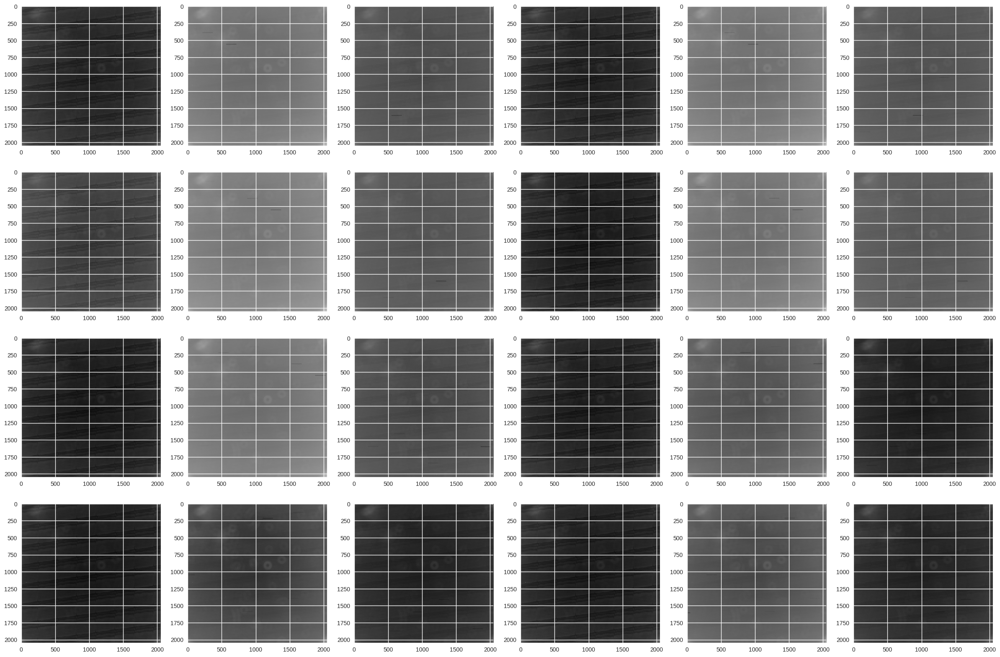

In [11]:
fig, axs = plt.subplots(4, 6, figsize=(6 * 4, 4 * 4))

for ax, path in zip(axs.flatten(), flat_paths_14):
    with fits.open(path) as hdul:
        data = hdul[0].data
    ax.imshow(data)

plt.tight_layout()
plt.show()

In [12]:
### Making a little table with the properties of the thing beside it

property_dict_list = []
for path in flat_paths_14:
    with fits.open(path) as hdul:
        property_dict = {}
        property_dict['IMAGETYP'] = hdul[0].header['IMAGETYP']
        property_dict['FILTER'] = hdul[0].header['FILTER']
        property_dict['EXPTIME'] = hdul[0].header['EXPTIME']
        property_dict['OBJCTRA'] = hdul[0].header['OBJCTRA']
        property_dict['OBJCTDEC'] = hdul[0].header['OBJCTDEC']
        property_dict['DATE-OBS'] = hdul[0].header['DATE-OBS']
        property_dict['JD-HELIO'] = hdul[0].header['JD-HELIO']
        property_dict['READOUTM'] = hdul[0].header['READOUTM']
        
    property_dict_list.append(property_dict)

pd.DataFrame(property_dict_list)

,IMAGETYP,FILTER,EXPTIME,OBJCTRA,OBJCTDEC,DATE-OBS,JD-HELIO,READOUTM
0,FLAT,B,5.0,19 20 55,+38 05 37,2023-10-14T16:23:06,2.460232e+06,1MHz High Sensitivity 16-bit
1,FLAT,R,5.0,19 17 41,+38 05 44,2023-10-14T16:19:51,2.460232e+06,1MHz High Sensitivity 16-bit
2,FLAT,V,5.0,19 19 18,+38 05 41,2023-10-14T16:21:28,2.460232e+06,1MHz High Sensitivity 16-bit
3,FLAT,B,5.0,19 21 06,+38 05 37,2023-10-14T16:23:17,2.460232e+06,1MHz High Sensitivity 16-bit
4,FLAT,R,5.0,19 17 51,+38 05 43,2023-10-14T16:20:02,2.460232e+06,1MHz High Sensitivity 16-bit
...,...,...,...,...,...,...,...,...
19,FLAT,R,5.0,19 18 45,+38 05 42,2023-10-14T16:20:56,2.460232e+06,1MHz High Sensitivity 16-bit
20,FLAT,V,5.0,19 20 23,+38 05 38,2023-10-14T16:22:33,2.460232e+06,1MHz High Sensitivity 16-bit
21,FLAT,B,5.0,19 22 12,+38 05 35,2023-10-14T16:24:23,2.460232e+06,1MHz High Sensitivity 16-bit
22,FLAT,R,5.0,19 18 56,+38 05 41,2023-10-14T16:21:07,2.460232e+06,1MHz High Sensitivity 16-bit


### scDarks 200s

In [13]:
scDark_paths_14 = sorted([dir_14 + f for f in listdir(dir_14) if 'scDark' in f])

print(f'There are {len(scDark_paths_14)} scDark files from 14-10-2023.')
scDark_paths_14

There are 10 scDark files from 14-10-2023.


['/home/shoaib/APT/Final_Project/original_data/14_10_2023/scDarkZalaz-200sec-1.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/scDarkZalaz-200sec-10.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/scDarkZalaz-200sec-2.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/scDarkZalaz-200sec-3.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/scDarkZalaz-200sec-4.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/scDarkZalaz-200sec-5.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/scDarkZalaz-200sec-6.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/scDarkZalaz-200sec-7.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/scDarkZalaz-200sec-8.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/scDarkZalaz-200sec-9.fit']

In [14]:
with fits.open(scDark_paths_14[0]) as hdul:
    hdul = hdul

hdul.info()

Filename: /home/shoaib/APT/Final_Project/original_data/14_10_2023/scDarkZalaz-200sec-1.fit
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      53   (2048, 2048)   int16 (rescales to uint16)   


In [15]:
hdul[0].header

SIMPLE  =                    T                                                  
BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     
NAXIS   =                    2 /number of axes                                  
NAXIS1  =                 2048 /fastest changing axis                           
NAXIS2  =                 2048 /next to fastest changing axis                   
BSCALE  =   1.0000000000000000 /physical = BZERO + BSCALE*array_value           
BZERO   =   32768.000000000000 /physical = BZERO + BSCALE*array_value           
DATE-OBS= '2023-10-14T16:28:14' /YYYY-MM-DDThh:mm:ss observation start, UT      
EXPTIME =   200.00000000000000 /Exposure time in seconds                        
EXPOSURE=   200.00000000000000 /Exposure time in seconds                        
SET-TEMP=  -60.000000000000000 /CCD temperature setpoint in C                   
CCD-TEMP=  -59.127998352050781 /CCD temperature at start of exposure in C       
XPIXSZ  =   13.5000000000000

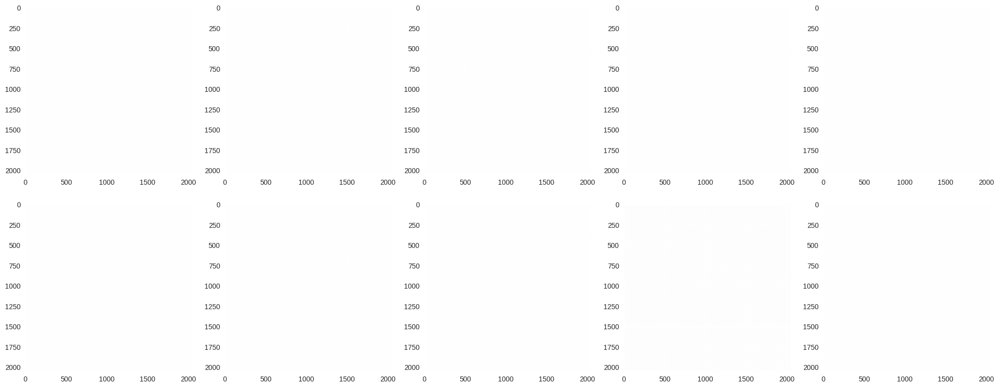

In [16]:
fig, axs = plt.subplots(2, 5, figsize=(5 * 4, 2 * 4))

for ax, path in zip(axs.flatten(), scDark_paths_14):
    with fits.open(path) as hdul:
        data = hdul[0].data
    ax.imshow(data)

plt.tight_layout()
plt.show()

In [17]:
### Making a little table with the properties of the thing beside it

property_dict_list = []
for path in scDark_paths_14:
    with fits.open(path) as hdul:
        property_dict = {}
        property_dict['IMAGETYP'] = hdul[0].header['IMAGETYP']
        # property_dict['FILTER'] = hdul[0].header['FILTER']
        property_dict['EXPTIME'] = hdul[0].header['EXPTIME']
        property_dict['OBJCTRA'] = hdul[0].header['OBJCTRA']
        property_dict['OBJCTDEC'] = hdul[0].header['OBJCTDEC']
        property_dict['DATE-OBS'] = hdul[0].header['DATE-OBS']
        property_dict['JD-HELIO'] = hdul[0].header['JD-HELIO']
        property_dict['READOUTM'] = hdul[0].header['READOUTM']
        
    property_dict_list.append(property_dict)

pd.DataFrame(property_dict_list)

,IMAGETYP,EXPTIME,OBJCTRA,OBJCTDEC,DATE-OBS,JD-HELIO,READOUTM
0,DARK,200.0,19 29 28,+38 05 27,2023-10-14T16:28:14,2.460232e+06,1MHz High Sensitivity 16-bit
1,DARK,200.0,20 00 25,+38 04 30,2023-10-14T16:59:08,2.460232e+06,1MHz High Sensitivity 16-bit
2,DARK,200.0,19 32 54,+38 05 21,2023-10-14T16:31:41,2.460232e+06,1MHz High Sensitivity 16-bit
3,DARK,200.0,19 36 21,+38 05 14,2023-10-14T16:35:06,2.460232e+06,1MHz High Sensitivity 16-bit
4,DARK,200.0,19 39 48,+38 05 08,2023-10-14T16:38:32,2.460232e+06,1MHz High Sensitivity 16-bit
5,DARK,200.0,19 43 13,+38 05 01,2023-10-14T16:41:58,2.460232e+06,1MHz High Sensitivity 16-bit
6,DARK,200.0,19 46 40,+38 04 55,2023-10-14T16:45:24,2.460232e+06,1MHz High Sensitivity 16-bit
7,DARK,200.0,19 50 06,+38 04 49,2023-10-14T16:48:50,2.460232e+06,1MHz High Sensitivity 16-bit
8,DARK,200.0,19 53 32,+38 04 42,2023-10-14T16:52:16,2.460232e+06,1MHz High Sensitivity 16-bit
9,DARK,200.0,19 56 58,+38 04 36,2023-10-14T16:55:42,2.460232e+06,1MHz High Sensitivity 16-bit


### Darks 600s

In [18]:
dark600_paths_14 = sorted([dir_14 + f for f in listdir(dir_14) if 'dark600' in f])

print(f'There are {len(dark600_paths_14)} 600s dark files from 14-10-2023.')
dark600_paths_14

There are 10 600s dark files from 14-10-2023.


['/home/shoaib/APT/Final_Project/original_data/14_10_2023/dark600s-0001_D.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/dark600s-0002_D.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/dark600s-0003_D.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/dark600s-0004_D.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/dark600s-0005_D.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/dark600s-0006_D.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/dark600s-0007_D.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/dark600s-0008_D.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/dark600s-0009_D.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/dark600s-0010_D.fit']

In [19]:
with fits.open(dark600_paths_14[0]) as hdul:
    hdul = hdul

hdul.info()

Filename: /home/shoaib/APT/Final_Project/original_data/14_10_2023/dark600s-0001_D.fit
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      36   (2048, 2048)   int16 (rescales to uint16)   


In [20]:
hdul[0].header

SIMPLE  =                    T                                                  
BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     
NAXIS   =                    2 /number of axes                                  
NAXIS1  =                 2048 /fastest changing axis                           
NAXIS2  =                 2048 /next to fastest changing axis                   
BSCALE  =   1.0000000000000000 /physical = BZERO + BSCALE*array_value           
BZERO   =   32768.000000000000 /physical = BZERO + BSCALE*array_value           
DATE-OBS= '2023-10-15T03:30:59' /YYYY-MM-DDThh:mm:ss observation start, UT      
EXPTIME =   600.00000000000000 /Exposure time in seconds                        
EXPOSURE=   600.00000000000000 /Exposure time in seconds                        
SET-TEMP=  -60.000000000000000 /CCD temperature setpoint in C                   
CCD-TEMP=  -59.127998352050781 /CCD temperature at start of exposure in C       
XPIXSZ  =   13.5000000000000

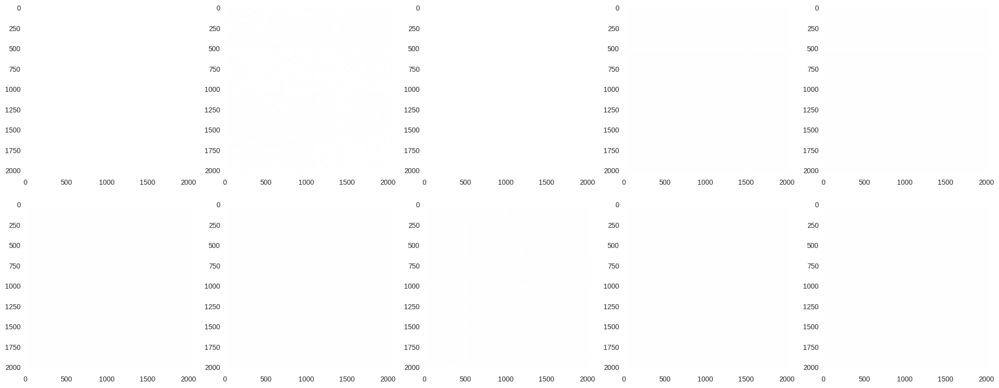

In [21]:
fig, axs = plt.subplots(2, 5, figsize=(5 * 4, 2 * 4))

for ax, path in zip(axs.flatten(), dark600_paths_14):
    with fits.open(path) as hdul:
        data = hdul[0].data
    ax.imshow(data)

plt.tight_layout()
plt.show()

In [22]:
### Making a little table with the properties of the thing beside it

property_dict_list = []
for path in dark600_paths_14:
    with fits.open(path) as hdul:
        property_dict = {}
        property_dict['IMAGETYP'] = hdul[0].header['IMAGETYP']
        # property_dict['FILTER'] = hdul[0].header['FILTER']
        property_dict['EXPTIME'] = hdul[0].header['EXPTIME']
        # property_dict['OBJCTRA'] = hdul[0].header['OBJCTRA']
        # property_dict['OBJCTDEC'] = hdul[0].header['OBJCTDEC']
        property_dict['DATE-OBS'] = hdul[0].header['DATE-OBS']
        property_dict['JD-HELIO'] = hdul[0].header['JD-HELIO']
        property_dict['READOUTM'] = hdul[0].header['READOUTM']
        
    property_dict_list.append(property_dict)

pd.DataFrame(property_dict_list)

,IMAGETYP,EXPTIME,DATE-OBS,JD-HELIO,READOUTM
0,DARK,600.0,2023-10-15T03:30:59,2.460233e+06,1MHz High Sensitivity 16-bit
1,DARK,600.0,2023-10-15T03:41:05,2.460233e+06,1MHz High Sensitivity 16-bit
2,DARK,600.0,2023-10-15T03:51:11,2.460233e+06,1MHz High Sensitivity 16-bit
3,DARK,600.0,2023-10-15T04:01:17,2.460233e+06,1MHz High Sensitivity 16-bit
4,DARK,600.0,2023-10-15T04:11:23,2.460233e+06,1MHz High Sensitivity 16-bit
5,DARK,600.0,2023-10-15T04:21:29,2.460233e+06,1MHz High Sensitivity 16-bit
6,DARK,600.0,2023-10-15T04:31:35,2.460233e+06,1MHz High Sensitivity 16-bit
7,DARK,600.0,2023-10-15T04:41:41,2.460233e+06,1MHz High Sensitivity 16-bit
8,DARK,600.0,2023-10-15T04:51:46,2.460233e+06,1MHz High Sensitivity 16-bit
9,DARK,600.0,2023-10-15T05:01:52,2.460233e+06,1MHz High Sensitivity 16-bit


### Sunset Darks 5s

In [23]:
darkZalaz_paths_14 = sorted([dir_14 + f for f in listdir(dir_14) if 'darkZalaz' in f])

print(f'There are {len(darkZalaz_paths_14)} sunset dark files from 14-10-2023.')
darkZalaz_paths_14

There are 10 sunset dark files from 14-10-2023.


['/home/shoaib/APT/Final_Project/original_data/14_10_2023/darkZalaz-5sec-1.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/darkZalaz-5sec-10.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/darkZalaz-5sec-2.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/darkZalaz-5sec-3.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/darkZalaz-5sec-4.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/darkZalaz-5sec-5.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/darkZalaz-5sec-6.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/darkZalaz-5sec-7.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/darkZalaz-5sec-8.fit',
 '/home/shoaib/APT/Final_Project/original_data/14_10_2023/darkZalaz-5sec-9.fit']

In [24]:
with fits.open(darkZalaz_paths_14[0]) as hdul:
    hdul = hdul

hdul.info()

Filename: /home/shoaib/APT/Final_Project/original_data/14_10_2023/darkZalaz-5sec-1.fit
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      53   (2048, 2048)   int16 (rescales to uint16)   


In [25]:
hdul[0].header

SIMPLE  =                    T                                                  
BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     
NAXIS   =                    2 /number of axes                                  
NAXIS1  =                 2048 /fastest changing axis                           
NAXIS2  =                 2048 /next to fastest changing axis                   
BSCALE  =   1.0000000000000000 /physical = BZERO + BSCALE*array_value           
BZERO   =   32768.000000000000 /physical = BZERO + BSCALE*array_value           
DATE-OBS= '2023-10-14T16:26:25' /YYYY-MM-DDThh:mm:ss observation start, UT      
EXPTIME =   5.0000000000000000 /Exposure time in seconds                        
EXPOSURE=   5.0000000000000000 /Exposure time in seconds                        
SET-TEMP=  -60.000000000000000 /CCD temperature setpoint in C                   
CCD-TEMP=  -59.127998352050781 /CCD temperature at start of exposure in C       
XPIXSZ  =   13.5000000000000

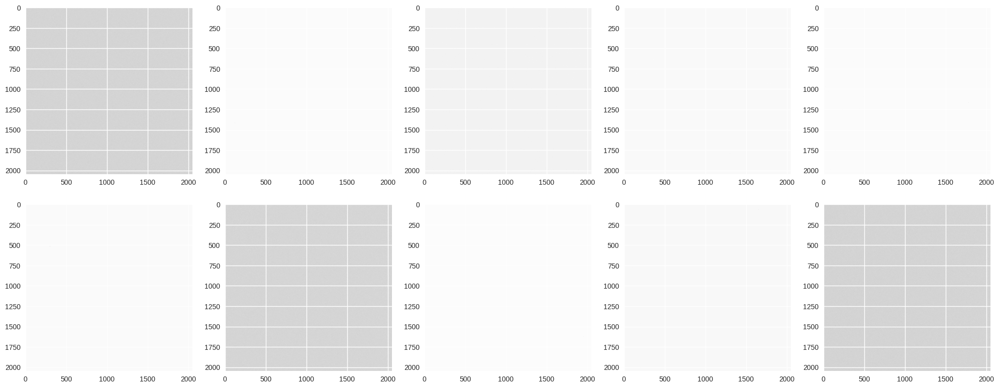

In [26]:
fig, axs = plt.subplots(2, 5, figsize=(5 * 4, 2 * 4))

for ax, path in zip(axs.flatten(), darkZalaz_paths_14):
    with fits.open(path) as hdul:
        data = hdul[0].data
    ax.imshow(data)

plt.tight_layout()
plt.show()

In [27]:
### Making a little table with the properties of the thing beside it

property_dict_list = []
for path in darkZalaz_paths_14:
    with fits.open(path) as hdul:
        property_dict = {}
        property_dict['IMAGETYP'] = hdul[0].header['IMAGETYP']
        # property_dict['FILTER'] = hdul[0].header['FILTER']
        property_dict['EXPTIME'] = hdul[0].header['EXPTIME']
        property_dict['OBJCTRA'] = hdul[0].header['OBJCTRA']
        property_dict['OBJCTDEC'] = hdul[0].header['OBJCTDEC']
        property_dict['DATE-OBS'] = hdul[0].header['DATE-OBS']
        property_dict['JD-HELIO'] = hdul[0].header['JD-HELIO']
        property_dict['READOUTM'] = hdul[0].header['READOUTM']
        
    property_dict_list.append(property_dict)

pd.DataFrame(property_dict_list)

,IMAGETYP,EXPTIME,OBJCTRA,OBJCTDEC,DATE-OBS,JD-HELIO,READOUTM
0,DARK,5.0,19 24 23,+38 05 37,2023-10-14T16:26:25,2.460232e+06,1MHz High Sensitivity 16-bit
1,DARK,5.0,19 26 02,+38 05 34,2023-10-14T16:28:04,2.460232e+06,1MHz High Sensitivity 16-bit
2,DARK,5.0,19 24 35,+38 05 37,2023-10-14T16:26:37,2.460232e+06,1MHz High Sensitivity 16-bit
3,DARK,5.0,19 24 46,+38 05 37,2023-10-14T16:26:48,2.460232e+06,1MHz High Sensitivity 16-bit
4,DARK,5.0,19 24 57,+38 05 36,2023-10-14T16:26:58,2.460232e+06,1MHz High Sensitivity 16-bit
5,DARK,5.0,19 25 07,+38 05 36,2023-10-14T16:27:09,2.460232e+06,1MHz High Sensitivity 16-bit
6,DARK,5.0,19 25 19,+38 05 35,2023-10-14T16:27:20,2.460232e+06,1MHz High Sensitivity 16-bit
7,DARK,5.0,19 25 29,+38 05 35,2023-10-14T16:27:31,2.460232e+06,1MHz High Sensitivity 16-bit
8,DARK,5.0,19 25 40,+38 05 35,2023-10-14T16:27:42,2.460232e+06,1MHz High Sensitivity 16-bit
9,DARK,5.0,19 25 51,+38 05 34,2023-10-14T16:27:53,2.460232e+06,1MHz High Sensitivity 16-bit


## 22-10-2023

In [28]:
dir_22 = '/home/shoaib/APT/Final_Project/original_data/22_10_2023/'

### Sunset Biases

In [29]:
bias_paths_22 = sorted([dir_22 + f for f in listdir(dir_22) if 'bias' in f])

print(f'There are {len(bias_paths_22)} sunset bias files from 22-10-2023.')
bias_paths_22

There are 10 sunset bias files from 22-10-2023.


['/home/shoaib/APT/Final_Project/original_data/22_10_2023/biasZalaz-1.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/biasZalaz-10.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/biasZalaz-2.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/biasZalaz-3.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/biasZalaz-4.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/biasZalaz-5.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/biasZalaz-6.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/biasZalaz-7.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/biasZalaz-8.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/biasZalaz-9.fit']

In [30]:
with fits.open(bias_paths_22[0]) as hdul:
    hdul = hdul

hdul.info()

Filename: /home/shoaib/APT/Final_Project/original_data/22_10_2023/biasZalaz-1.fit
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      53   (2048, 2048)   int16 (rescales to uint16)   


In [31]:
hdul[0].header

SIMPLE  =                    T                                                  
BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     
NAXIS   =                    2 /number of axes                                  
NAXIS1  =                 2048 /fastest changing axis                           
NAXIS2  =                 2048 /next to fastest changing axis                   
BSCALE  =   1.0000000000000000 /physical = BZERO + BSCALE*array_value           
BZERO   =   32768.000000000000 /physical = BZERO + BSCALE*array_value           
DATE-OBS= '2023-10-22T16:05:55' /YYYY-MM-DDThh:mm:ss observation start, UT      
EXPTIME =  0.00000000000000000 /Exposure time in seconds                        
EXPOSURE=  0.00000000000000000 /Exposure time in seconds                        
SET-TEMP=  -60.000000000000000 /CCD temperature setpoint in C                   
CCD-TEMP=  -59.127998352050781 /CCD temperature at start of exposure in C       
XPIXSZ  =   13.5000000000000

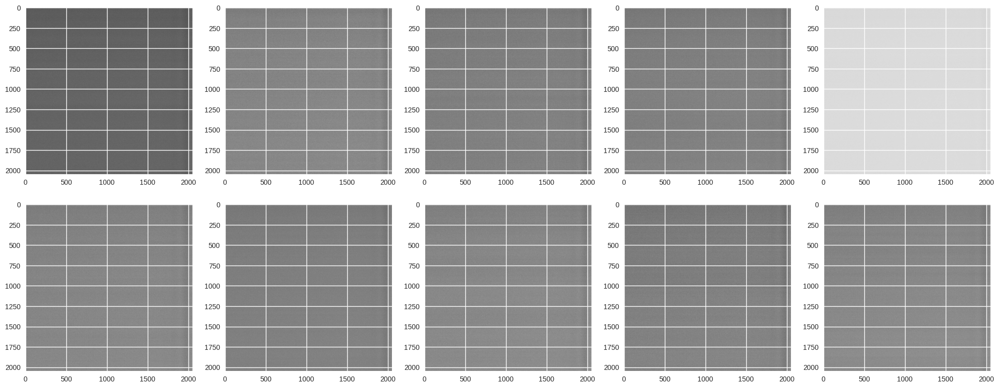

In [32]:
fig, axs = plt.subplots(2, 5, figsize=(5 * 4, 2 * 4))

for ax, path in zip(axs.flatten(), bias_paths_22):
    with fits.open(path) as hdul:
        data = hdul[0].data
    ax.imshow(data)

plt.tight_layout()
plt.show()

In [33]:
### Making a little table with the properties of the thing beside it

property_dict_list = []
for path in bias_paths_22:
    with fits.open(path) as hdul:
        property_dict = {}
        property_dict['IMAGETYP'] = hdul[0].header['IMAGETYP']
        # property_dict['FILTER'] = hdul[0].header['FILTER']
        property_dict['EXPTIME'] = hdul[0].header['EXPTIME']
        property_dict['OBJCTRA'] = hdul[0].header['OBJCTRA']
        property_dict['OBJCTDEC'] = hdul[0].header['OBJCTDEC']
        property_dict['DATE-OBS'] = hdul[0].header['DATE-OBS']
        property_dict['JD-HELIO'] = hdul[0].header['JD-HELIO']
        property_dict['READOUTM'] = hdul[0].header['READOUTM']
        
    property_dict_list.append(property_dict)

pd.DataFrame(property_dict_list)

,IMAGETYP,EXPTIME,OBJCTRA,OBJCTDEC,DATE-OBS,JD-HELIO,READOUTM
0,BIAS,0.0,19 35 14,+38 05 16,2023-10-22T16:05:55,2.460240e+06,5MHz High Sensitivity 16-bit
1,BIAS,0.0,19 35 35,+38 05 15,2023-10-22T16:06:17,2.460240e+06,5MHz High Sensitivity 16-bit
2,BIAS,0.0,19 35 16,+38 05 16,2023-10-22T16:05:58,2.460240e+06,5MHz High Sensitivity 16-bit
3,BIAS,0.0,19 35 18,+38 05 16,2023-10-22T16:06:00,2.460240e+06,5MHz High Sensitivity 16-bit
4,BIAS,0.0,19 35 21,+38 05 16,2023-10-22T16:06:03,2.460240e+06,5MHz High Sensitivity 16-bit
5,BIAS,0.0,19 35 23,+38 05 16,2023-10-22T16:06:05,2.460240e+06,5MHz High Sensitivity 16-bit
6,BIAS,0.0,19 35 25,+38 05 15,2023-10-22T16:06:07,2.460240e+06,5MHz High Sensitivity 16-bit
7,BIAS,0.0,19 35 28,+38 05 16,2023-10-22T16:06:10,2.460240e+06,5MHz High Sensitivity 16-bit
8,BIAS,0.0,19 35 30,+38 05 15,2023-10-22T16:06:12,2.460240e+06,5MHz High Sensitivity 16-bit
9,BIAS,0.0,19 35 32,+38 05 16,2023-10-22T16:06:14,2.460240e+06,5MHz High Sensitivity 16-bit


### Sunset Flats 5s

In [34]:
flat_paths_22 = sorted([dir_22 + f for f in listdir(dir_22) if 'flat' in f])

print(f'There are {len(flat_paths_22)} sunset flat files in B, R, and V from 22-10-2023.')
flat_paths_22

There are 48 sunset flat files in B, R, and V from 22-10-2023.


['/home/shoaib/APT/Final_Project/original_data/22_10_2023/flatZalaz-5sec-1_B.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/flatZalaz-5sec-1_Ha.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/flatZalaz-5sec-1_HaContinuum.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/flatZalaz-5sec-1_R.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/flatZalaz-5sec-1_SII.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/flatZalaz-5sec-1_V.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/flatZalaz-5sec-2_B.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/flatZalaz-5sec-2_Ha.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/flatZalaz-5sec-2_HaContinuum.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/flatZalaz-5sec-2_R.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/flatZalaz-5sec-2_SII.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/fla

In [35]:
with fits.open(flat_paths_22[0]) as hdul:
    hdul = hdul

hdul.info()

Filename: /home/shoaib/APT/Final_Project/original_data/22_10_2023/flatZalaz-5sec-1_B.fit
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      54   (2048, 2048)   int16 (rescales to uint16)   


In [36]:
hdul[0].header

SIMPLE  =                    T                                                  
BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     
NAXIS   =                    2 /number of axes                                  
NAXIS1  =                 2048 /fastest changing axis                           
NAXIS2  =                 2048 /next to fastest changing axis                   
BSCALE  =   1.0000000000000000 /physical = BZERO + BSCALE*array_value           
BZERO   =   32768.000000000000 /physical = BZERO + BSCALE*array_value           
DATE-OBS= '2023-10-22T16:02:50' /YYYY-MM-DDThh:mm:ss observation start, UT      
EXPTIME =   5.0000000000000000 /Exposure time in seconds                        
EXPOSURE=   5.0000000000000000 /Exposure time in seconds                        
SET-TEMP=  -60.000000000000000 /CCD temperature setpoint in C                   
CCD-TEMP=  -59.127998352050781 /CCD temperature at start of exposure in C       
XPIXSZ  =   13.5000000000000

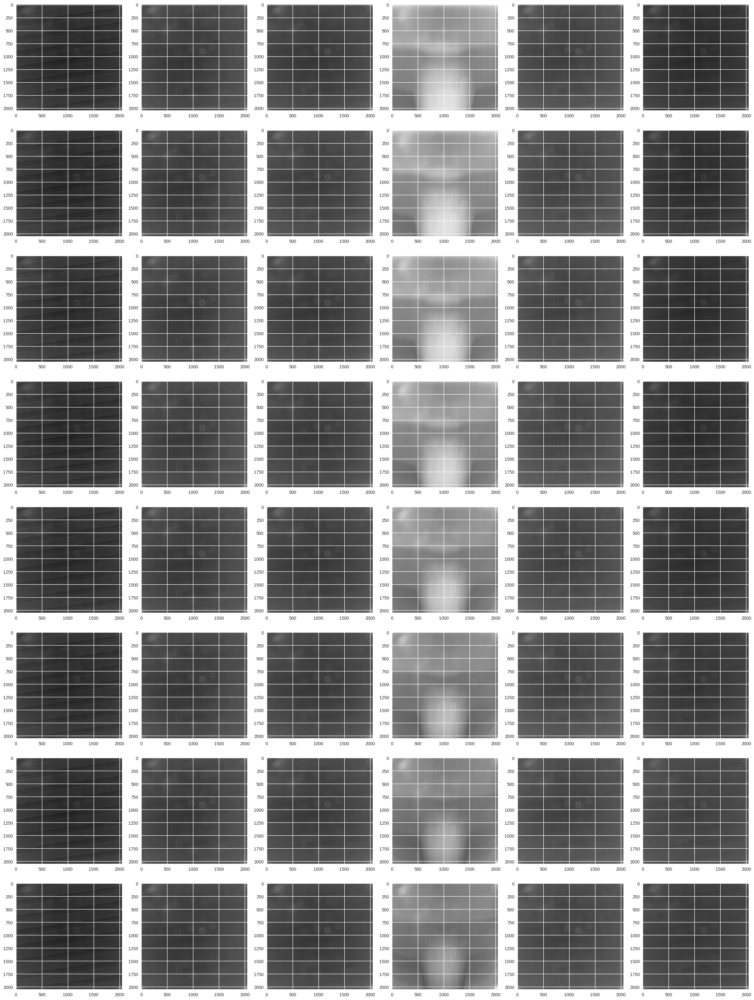

In [37]:
fig, axs = plt.subplots(8, 6, figsize=(6 * 4, 8 * 4))

for ax, path in zip(axs.flatten(), flat_paths_22):
    with fits.open(path) as hdul:
        data = hdul[0].data
    ax.imshow(data)

plt.tight_layout()
plt.show()

In [38]:
### Making a little table with the properties of the thing beside it

property_dict_list = []
for path in flat_paths_22:
    with fits.open(path) as hdul:
        property_dict = {}
        property_dict['IMAGETYP'] = hdul[0].header['IMAGETYP']
        property_dict['FILTER'] = hdul[0].header['FILTER']
        property_dict['EXPTIME'] = hdul[0].header['EXPTIME']
        property_dict['OBJCTRA'] = hdul[0].header['OBJCTRA']
        property_dict['OBJCTDEC'] = hdul[0].header['OBJCTDEC']
        property_dict['DATE-OBS'] = hdul[0].header['DATE-OBS']
        property_dict['JD-HELIO'] = hdul[0].header['JD-HELIO']
        property_dict['READOUTM'] = hdul[0].header['READOUTM']
        
    property_dict_list.append(property_dict)

pd.DataFrame(property_dict_list)

,IMAGETYP,FILTER,EXPTIME,OBJCTRA,OBJCTDEC,DATE-OBS,JD-HELIO,READOUTM
0,FLAT,B,5.0,19 32 07,+38 05 17,2023-10-22T16:02:50,2.460240e+06,5MHz High Sensitivity 16-bit
1,FLAT,Ha,5.0,19 19 29,+38 05 41,2023-10-22T15:50:14,2.460240e+06,5MHz High Sensitivity 16-bit
2,FLAT,HaContinuum,5.0,19 18 21,+38 05 43,2023-10-22T15:49:06,2.460240e+06,5MHz High Sensitivity 16-bit
3,FLAT,R,5.0,19 29 50,+38 05 21,2023-10-22T16:00:33,2.460240e+06,5MHz High Sensitivity 16-bit
4,FLAT,SII,5.0,19 20 36,+38 05 38,2023-10-22T15:51:21,2.460240e+06,5MHz High Sensitivity 16-bit
...,...,...,...,...,...,...,...,...
43,FLAT,Ha,5.0,19 20 21,+38 05 39,2023-10-22T15:51:06,2.460240e+06,5MHz High Sensitivity 16-bit
44,FLAT,HaContinuum,5.0,19 19 13,+38 05 41,2023-10-22T15:49:58,2.460240e+06,5MHz High Sensitivity 16-bit
45,FLAT,R,5.0,19 30 42,+38 05 19,2023-10-22T16:01:25,2.460240e+06,5MHz High Sensitivity 16-bit
46,FLAT,SII,5.0,19 21 29,+38 05 37,2023-10-22T15:52:13,2.460240e+06,5MHz High Sensitivity 16-bit


### scDarks 200s

In [39]:
scDark_paths_22 = sorted([dir_22 + f for f in listdir(dir_22) if 'scDark' in f])

print(f'There are {len(scDark_paths_22)} scDark files from 22-10-2023.')
scDark_paths_22

There are 10 scDark files from 22-10-2023.


['/home/shoaib/APT/Final_Project/original_data/22_10_2023/scDarkZalaz-200sec-1.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/scDarkZalaz-200sec-10.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/scDarkZalaz-200sec-2.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/scDarkZalaz-200sec-3.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/scDarkZalaz-200sec-4.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/scDarkZalaz-200sec-5.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/scDarkZalaz-200sec-6.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/scDarkZalaz-200sec-7.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/scDarkZalaz-200sec-8.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/scDarkZalaz-200sec-9.fit']

In [40]:
with fits.open(scDark_paths_22[0]) as hdul:
    hdul = hdul

hdul.info()

Filename: /home/shoaib/APT/Final_Project/original_data/22_10_2023/scDarkZalaz-200sec-1.fit
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      53   (2048, 2048)   int16 (rescales to uint16)   


In [41]:
hdul[0].header

SIMPLE  =                    T                                                  
BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     
NAXIS   =                    2 /number of axes                                  
NAXIS1  =                 2048 /fastest changing axis                           
NAXIS2  =                 2048 /next to fastest changing axis                   
BSCALE  =   1.0000000000000000 /physical = BZERO + BSCALE*array_value           
BZERO   =   32768.000000000000 /physical = BZERO + BSCALE*array_value           
DATE-OBS= '2023-10-22T16:07:33' /YYYY-MM-DDThh:mm:ss observation start, UT      
EXPTIME =   200.00000000000000 /Exposure time in seconds                        
EXPOSURE=   200.00000000000000 /Exposure time in seconds                        
SET-TEMP=  -60.000000000000000 /CCD temperature setpoint in C                   
CCD-TEMP=  -59.127998352050781 /CCD temperature at start of exposure in C       
XPIXSZ  =   13.5000000000000

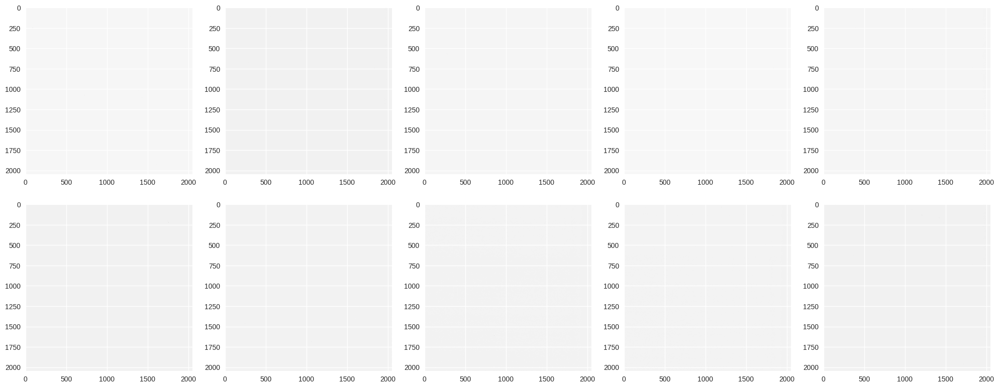

In [42]:
fig, axs = plt.subplots(2, 5, figsize=(5 * 4, 2 * 4))

for ax, path in zip(axs.flatten(), scDark_paths_22):
    with fits.open(path) as hdul:
        data = hdul[0].data
    ax.imshow(data)

plt.tight_layout()
plt.show()

In [43]:
### Making a little table with the properties of the thing beside it

property_dict_list = []
for path in scDark_paths_22:
    with fits.open(path) as hdul:
        property_dict = {}
        property_dict['IMAGETYP'] = hdul[0].header['IMAGETYP']
        # property_dict['FILTER'] = hdul[0].header['FILTER']
        property_dict['EXPTIME'] = hdul[0].header['EXPTIME']
        property_dict['OBJCTRA'] = hdul[0].header['OBJCTRA']
        property_dict['OBJCTDEC'] = hdul[0].header['OBJCTDEC']
        property_dict['DATE-OBS'] = hdul[0].header['DATE-OBS']
        property_dict['JD-HELIO'] = hdul[0].header['JD-HELIO']
        property_dict['READOUTM'] = hdul[0].header['READOUTM']
        
    property_dict_list.append(property_dict)

pd.DataFrame(property_dict_list)

,IMAGETYP,EXPTIME,OBJCTRA,OBJCTDEC,DATE-OBS,JD-HELIO,READOUTM
0,DARK,200.0,19 40 11,+38 05 07,2023-10-22T16:07:33,2.460240e+06,5MHz High Sensitivity 16-bit
1,DARK,200.0,20 10 37,+38 04 11,2023-10-22T16:37:55,2.460240e+06,5MHz High Sensitivity 16-bit
2,DARK,200.0,19 43 34,+38 05 01,2023-10-22T16:10:56,2.460240e+06,5MHz High Sensitivity 16-bit
3,DARK,200.0,19 46 57,+38 04 54,2023-10-22T16:14:18,2.460240e+06,5MHz High Sensitivity 16-bit
4,DARK,200.0,19 50 20,+38 04 48,2023-10-22T16:17:40,2.460240e+06,5MHz High Sensitivity 16-bit
5,DARK,200.0,19 53 43,+38 04 41,2023-10-22T16:21:03,2.460240e+06,5MHz High Sensitivity 16-bit
6,DARK,200.0,19 57 06,+38 04 36,2023-10-22T16:24:25,2.460240e+06,5MHz High Sensitivity 16-bit
7,DARK,200.0,20 00 28,+38 04 29,2023-10-22T16:27:47,2.460240e+06,5MHz High Sensitivity 16-bit
8,DARK,200.0,20 03 51,+38 04 23,2023-10-22T16:31:10,2.460240e+06,5MHz High Sensitivity 16-bit
9,DARK,200.0,20 07 14,+38 04 17,2023-10-22T16:34:32,2.460240e+06,5MHz High Sensitivity 16-bit


### Darks 600s

In [44]:
dark600_paths_22 = sorted([dir_22 + f for f in listdir(dir_22) if 'dark600' in f])

print(f'There are {len(dark600_paths_22)} 600s dark files from 22-10-2023.')
dark600_paths_22

There are 10 600s dark files from 22-10-2023.


['/home/shoaib/APT/Final_Project/original_data/22_10_2023/dark600s-0001_D.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/dark600s-0002_D.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/dark600s-0003_D.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/dark600s-0004_D.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/dark600s-0005_D.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/dark600s-0006_D.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/dark600s-0007_D.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/dark600s-0008_D.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/dark600s-0009_D.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/dark600s-0010_D.fit']

In [45]:
with fits.open(dark600_paths_22[0]) as hdul:
    hdul = hdul

hdul.info()

Filename: /home/shoaib/APT/Final_Project/original_data/22_10_2023/dark600s-0001_D.fit
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      53   (2048, 2048)   int16 (rescales to uint16)   


In [46]:
hdul[0].header

SIMPLE  =                    T                                                  
BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     
NAXIS   =                    2 /number of axes                                  
NAXIS1  =                 2048 /fastest changing axis                           
NAXIS2  =                 2048 /next to fastest changing axis                   
BSCALE  =   1.0000000000000000 /physical = BZERO + BSCALE*array_value           
BZERO   =   32768.000000000000 /physical = BZERO + BSCALE*array_value           
DATE-OBS= '2023-10-23T02:31:16' /YYYY-MM-DDThh:mm:ss observation start, UT      
EXPTIME =   600.00000000000000 /Exposure time in seconds                        
EXPOSURE=   600.00000000000000 /Exposure time in seconds                        
SET-TEMP=  -60.000000000000000 /CCD temperature setpoint in C                   
CCD-TEMP=  -59.127998352050781 /CCD temperature at start of exposure in C       
XPIXSZ  =   13.5000000000000

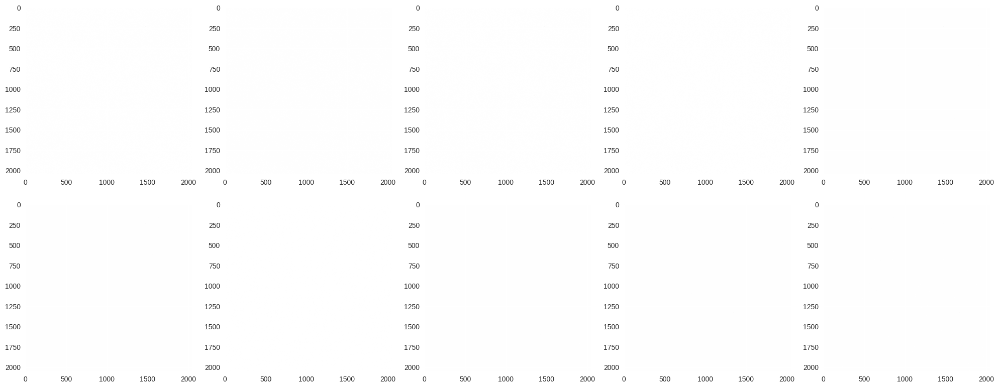

In [47]:
fig, axs = plt.subplots(2, 5, figsize=(5 * 4, 2 * 4))

for ax, path in zip(axs.flatten(), dark600_paths_22):
    with fits.open(path) as hdul:
        data = hdul[0].data
    ax.imshow(data)

plt.tight_layout()
plt.show()

In [48]:
### Making a little table with the properties of the thing beside it

property_dict_list = []
for path in dark600_paths_22:
    with fits.open(path) as hdul:
        property_dict = {}
        property_dict['IMAGETYP'] = hdul[0].header['IMAGETYP']
        # property_dict['FILTER'] = hdul[0].header['FILTER']
        property_dict['EXPTIME'] = hdul[0].header['EXPTIME']
        # property_dict['OBJCTRA'] = hdul[0].header['OBJCTRA']
        # property_dict['OBJCTDEC'] = hdul[0].header['OBJCTDEC']
        property_dict['DATE-OBS'] = hdul[0].header['DATE-OBS']
        property_dict['JD-HELIO'] = hdul[0].header['JD-HELIO']
        property_dict['READOUTM'] = hdul[0].header['READOUTM']
        
    property_dict_list.append(property_dict)

pd.DataFrame(property_dict_list)

,IMAGETYP,EXPTIME,DATE-OBS,JD-HELIO,READOUTM
0,DARK,600.0,2023-10-23T02:31:16,2.460241e+06,1MHz High Sensitivity 16-bit
1,DARK,600.0,2023-10-23T02:41:22,2.460241e+06,1MHz High Sensitivity 16-bit
2,DARK,600.0,2023-10-23T02:51:28,2.460241e+06,1MHz High Sensitivity 16-bit
3,DARK,600.0,2023-10-23T03:01:34,2.460241e+06,1MHz High Sensitivity 16-bit
4,DARK,600.0,2023-10-23T03:11:40,2.460241e+06,1MHz High Sensitivity 16-bit
5,DARK,600.0,2023-10-23T03:21:46,2.460241e+06,1MHz High Sensitivity 16-bit
6,DARK,600.0,2023-10-23T03:31:52,2.460241e+06,1MHz High Sensitivity 16-bit
7,DARK,600.0,2023-10-23T03:41:58,2.460241e+06,1MHz High Sensitivity 16-bit
8,DARK,600.0,2023-10-23T03:52:04,2.460241e+06,1MHz High Sensitivity 16-bit
9,DARK,600.0,2023-10-23T04:02:10,2.460241e+06,1MHz High Sensitivity 16-bit


### Sunset Darks 5s

In [49]:
darkZalaz_paths_22 = sorted([dir_22 + f for f in listdir(dir_22) if 'darkZalaz' in f])

print(f'There are {len(darkZalaz_paths_22)} sunset dark files from 22-10-2023.')
darkZalaz_paths_22

There are 10 sunset dark files from 22-10-2023.


['/home/shoaib/APT/Final_Project/original_data/22_10_2023/darkZalaz-5sec-1.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/darkZalaz-5sec-10.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/darkZalaz-5sec-2.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/darkZalaz-5sec-3.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/darkZalaz-5sec-4.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/darkZalaz-5sec-5.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/darkZalaz-5sec-6.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/darkZalaz-5sec-7.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/darkZalaz-5sec-8.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/darkZalaz-5sec-9.fit']

In [50]:
with fits.open(darkZalaz_paths_22[0]) as hdul:
    hdul = hdul

hdul.info()

Filename: /home/shoaib/APT/Final_Project/original_data/22_10_2023/darkZalaz-5sec-1.fit
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      53   (2048, 2048)   int16 (rescales to uint16)   


In [51]:
hdul[0].header

SIMPLE  =                    T                                                  
BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     
NAXIS   =                    2 /number of axes                                  
NAXIS1  =                 2048 /fastest changing axis                           
NAXIS2  =                 2048 /next to fastest changing axis                   
BSCALE  =   1.0000000000000000 /physical = BZERO + BSCALE*array_value           
BZERO   =   32768.000000000000 /physical = BZERO + BSCALE*array_value           
DATE-OBS= '2023-10-22T16:06:19' /YYYY-MM-DDThh:mm:ss observation start, UT      
EXPTIME =   5.0000000000000000 /Exposure time in seconds                        
EXPOSURE=   5.0000000000000000 /Exposure time in seconds                        
SET-TEMP=  -60.000000000000000 /CCD temperature setpoint in C                   
CCD-TEMP=  -59.127998352050781 /CCD temperature at start of exposure in C       
XPIXSZ  =   13.5000000000000

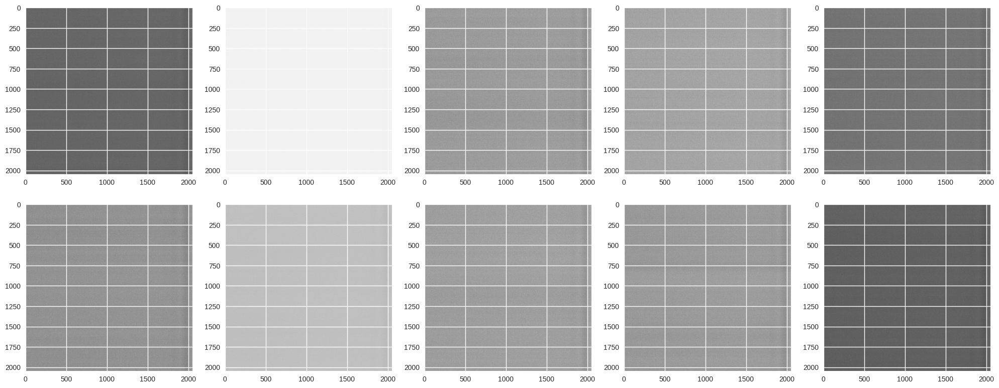

In [52]:
fig, axs = plt.subplots(2, 5, figsize=(5 * 4, 2 * 4))

for ax, path in zip(axs.flatten(), darkZalaz_paths_22):
    with fits.open(path) as hdul:
        data = hdul[0].data
    ax.imshow(data)

plt.tight_layout()
plt.show()

In [53]:
### Making a little table with the properties of the thing beside it

property_dict_list = []
for path in darkZalaz_paths_22:
    with fits.open(path) as hdul:
        property_dict = {}
        property_dict['IMAGETYP'] = hdul[0].header['IMAGETYP']
        # property_dict['FILTER'] = hdul[0].header['FILTER']
        property_dict['EXPTIME'] = hdul[0].header['EXPTIME']
        property_dict['OBJCTRA'] = hdul[0].header['OBJCTRA']
        property_dict['OBJCTDEC'] = hdul[0].header['OBJCTDEC']
        property_dict['DATE-OBS'] = hdul[0].header['DATE-OBS']
        property_dict['JD-HELIO'] = hdul[0].header['JD-HELIO']
        property_dict['READOUTM'] = hdul[0].header['READOUTM']
        
    property_dict_list.append(property_dict)

pd.DataFrame(property_dict_list)

,IMAGETYP,EXPTIME,OBJCTRA,OBJCTDEC,DATE-OBS,JD-HELIO,READOUTM
0,DARK,5.0,19 35 43,+38 05 15,2023-10-22T16:06:19,2.460240e+06,5MHz High Sensitivity 16-bit
1,DARK,5.0,19 36 49,+38 05 13,2023-10-22T16:07:26,2.460240e+06,5MHz High Sensitivity 16-bit
2,DARK,5.0,19 35 50,+38 05 15,2023-10-22T16:06:27,2.460240e+06,5MHz High Sensitivity 16-bit
3,DARK,5.0,19 35 57,+38 05 15,2023-10-22T16:06:34,2.460240e+06,5MHz High Sensitivity 16-bit
4,DARK,5.0,19 36 05,+38 05 15,2023-10-22T16:06:42,2.460240e+06,5MHz High Sensitivity 16-bit
5,DARK,5.0,19 36 12,+38 05 14,2023-10-22T16:06:49,2.460240e+06,5MHz High Sensitivity 16-bit
6,DARK,5.0,19 36 19,+38 05 14,2023-10-22T16:06:56,2.460240e+06,5MHz High Sensitivity 16-bit
7,DARK,5.0,19 36 27,+38 05 14,2023-10-22T16:07:04,2.460240e+06,5MHz High Sensitivity 16-bit
8,DARK,5.0,19 36 34,+38 05 14,2023-10-22T16:07:11,2.460240e+06,5MHz High Sensitivity 16-bit
9,DARK,5.0,19 36 42,+38 05 13,2023-10-22T16:07:18,2.460240e+06,5MHz High Sensitivity 16-bit


### MRK817

In [54]:
Mrk817_paths_22 = sorted([dir_22 + f for f in listdir(dir_22) if 'Mrk817' in f])

print(f'There are {len(Mrk817_paths_22)} Mrk817 files from 22-10-2023.')
Mrk817_paths_22

There are 18 Mrk817 files from 22-10-2023.


['/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk817-0001_B.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk817-0001_Ha.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk817-0001_R.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk817-0001_SII.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk817-0001_V.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk817-0001_cnt.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk817-0002_B.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk817-0002_Ha.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk817-0002_R.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk817-0002_SII.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk817-0002_V.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk817-0002_cnt.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2

In [55]:
with fits.open(Mrk817_paths_22[0]) as hdul:
    hdul = hdul

hdul.info()

Filename: /home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk817-0001_B.fit
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      54   (2048, 2048)   int16 (rescales to uint16)   


In [56]:
hdul[0].header

SIMPLE  =                    T                                                  
BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     
NAXIS   =                    2 /number of axes                                  
NAXIS1  =                 2048 /fastest changing axis                           
NAXIS2  =                 2048 /next to fastest changing axis                   
BSCALE  =   1.0000000000000000 /physical = BZERO + BSCALE*array_value           
BZERO   =   32768.000000000000 /physical = BZERO + BSCALE*array_value           
DATE-OBS= '2023-10-22T17:14:00' /YYYY-MM-DDThh:mm:ss observation start, UT      
EXPTIME =   180.00000000000000 /Exposure time in seconds                        
EXPOSURE=   180.00000000000000 /Exposure time in seconds                        
SET-TEMP=  -60.000000000000000 /CCD temperature setpoint in C                   
CCD-TEMP=  -59.127998352050781 /CCD temperature at start of exposure in C       
XPIXSZ  =   13.5000000000000

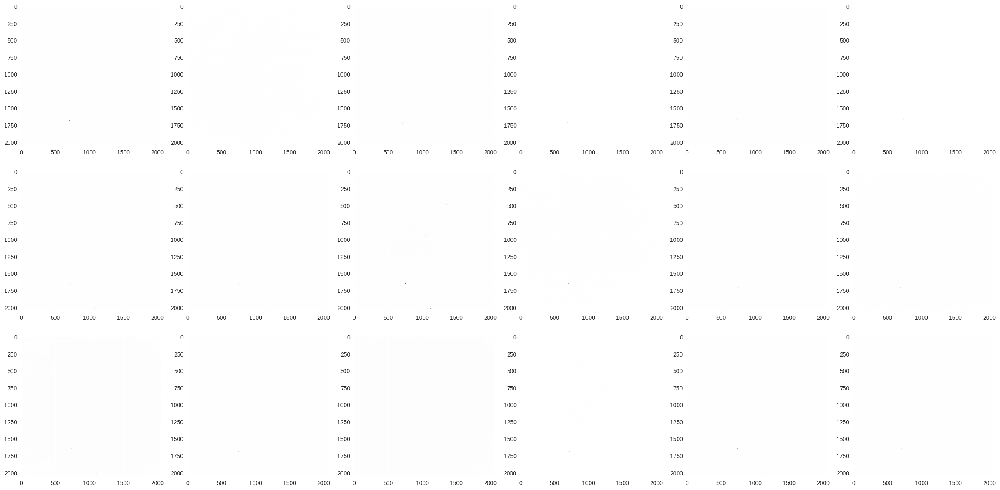

In [57]:
fig, axs = plt.subplots(3, 6, figsize=(6 * 4, 3 * 4))

for ax, path in zip(axs.flatten(), Mrk817_paths_22):
    with fits.open(path) as hdul:
        data = hdul[0].data
    ax.imshow(data)

plt.tight_layout()
plt.show()

In [58]:
### Making a little table with the properties of the thing beside it

property_dict_list = []
for path in Mrk817_paths_22:
    with fits.open(path) as hdul:
        property_dict = {}
        property_dict['IMAGETYP'] = hdul[0].header['IMAGETYP']
        property_dict['FILTER'] = hdul[0].header['FILTER']
        property_dict['EXPTIME'] = hdul[0].header['EXPTIME']
        property_dict['OBJCTRA'] = hdul[0].header['OBJCTRA']
        property_dict['OBJCTDEC'] = hdul[0].header['OBJCTDEC']
        property_dict['DATE-OBS'] = hdul[0].header['DATE-OBS']
        property_dict['JD-HELIO'] = hdul[0].header['JD-HELIO']
        property_dict['READOUTM'] = hdul[0].header['READOUTM']
        
    property_dict_list.append(property_dict)

pd.DataFrame(property_dict_list)

,IMAGETYP,FILTER,EXPTIME,OBJCTRA,OBJCTDEC,DATE-OBS,JD-HELIO,READOUTM
0,LIGHT,B,180.0,14 36 20,+58 47 42,2023-10-22T17:14:00,2.460240e+06,1MHz High Sensitivity 16-bit
1,LIGHT,Ha,240.0,14 36 19,+58 47 52,2023-10-22T17:26:45,2.460240e+06,1MHz High Sensitivity 16-bit
2,LIGHT,R,90.0,14 36 20,+58 47 57,2023-10-22T17:19:22,2.460240e+06,1MHz High Sensitivity 16-bit
3,LIGHT,SII,300.0,14 36 19,+58 47 55,2023-10-22T17:31:10,2.460240e+06,1MHz High Sensitivity 16-bit
4,LIGHT,V,90.0,14 36 21,+58 47 34,2023-10-22T17:17:25,2.460240e+06,1MHz High Sensitivity 16-bit
5,LIGHT,HaContinuum,300.0,14 36 21,+58 47 35,2023-10-22T17:21:18,2.460240e+06,1MHz High Sensitivity 16-bit
6,LIGHT,B,180.0,14 36 20,+58 47 33,2023-10-22T17:36:31,2.460240e+06,1MHz High Sensitivity 16-bit
7,LIGHT,Ha,240.0,14 36 22,+58 47 36,2023-10-22T17:49:08,2.460240e+06,1MHz High Sensitivity 16-bit
8,LIGHT,R,90.0,14 36 22,+58 47 32,2023-10-22T17:41:47,2.460240e+06,1MHz High Sensitivity 16-bit
9,LIGHT,SII,300.0,14 36 19,+58 47 35,2023-10-22T17:53:33,2.460240e+06,1MHz High Sensitivity 16-bit


### MRK335

In [59]:
Mrk335_paths_22 = sorted([dir_22 + f for f in listdir(dir_22) if 'Mrk335' in f])

print(f'There are {len(Mrk335_paths_22)} Mrk335 files from 22-10-2023.')
Mrk335_paths_22

There are 18 Mrk335 files from 22-10-2023.


['/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk335-0001_B.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk335-0001_Ha.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk335-0001_R.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk335-0001_SII.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk335-0001_V.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk335-0001_cnt.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk335-0002_B.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk335-0002_Ha.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk335-0002_R.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk335-0002_SII.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk335-0002_V.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk335-0002_cnt.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2

In [60]:
with fits.open(Mrk335_paths_22[0]) as hdul:
    hdul = hdul

hdul.info()

Filename: /home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk335-0001_B.fit
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      54   (2048, 2048)   int16 (rescales to uint16)   


In [61]:
hdul[0].header

SIMPLE  =                    T                                                  
BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     
NAXIS   =                    2 /number of axes                                  
NAXIS1  =                 2048 /fastest changing axis                           
NAXIS2  =                 2048 /next to fastest changing axis                   
BSCALE  =   1.0000000000000000 /physical = BZERO + BSCALE*array_value           
BZERO   =   32768.000000000000 /physical = BZERO + BSCALE*array_value           
DATE-OBS= '2023-10-22T18:27:21' /YYYY-MM-DDThh:mm:ss observation start, UT      
EXPTIME =   240.00000000000000 /Exposure time in seconds                        
EXPOSURE=   240.00000000000000 /Exposure time in seconds                        
SET-TEMP=  -60.000000000000000 /CCD temperature setpoint in C                   
CCD-TEMP=  -59.127998352050781 /CCD temperature at start of exposure in C       
XPIXSZ  =   13.5000000000000

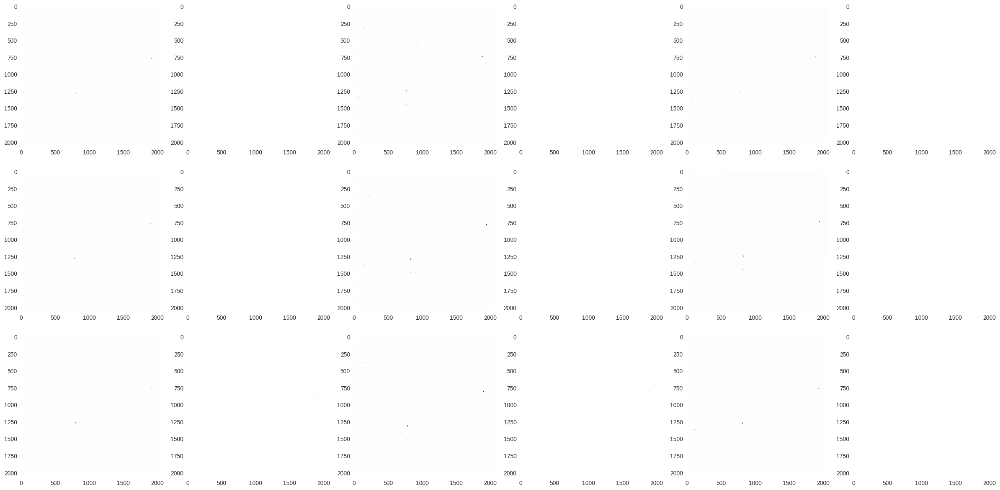

In [62]:
fig, axs = plt.subplots(3, 6, figsize=(6 * 4, 3 * 4))

for ax, path in zip(axs.flatten(), Mrk335_paths_22):
    with fits.open(path) as hdul:
        data = hdul[0].data
    ax.imshow(data)

plt.tight_layout()
plt.show()

In [63]:
### Making a little table with the properties of the thing beside it

property_dict_list = []
for path in Mrk335_paths_22:
    with fits.open(path) as hdul:
        property_dict = {}
        property_dict['IMAGETYP'] = hdul[0].header['IMAGETYP']
        property_dict['FILTER'] = hdul[0].header['FILTER']
        property_dict['EXPTIME'] = hdul[0].header['EXPTIME']
        property_dict['OBJCTRA'] = hdul[0].header['OBJCTRA']
        property_dict['OBJCTDEC'] = hdul[0].header['OBJCTDEC']
        property_dict['DATE-OBS'] = hdul[0].header['DATE-OBS']
        property_dict['JD-HELIO'] = hdul[0].header['JD-HELIO']
        property_dict['READOUTM'] = hdul[0].header['READOUTM']
        
    property_dict_list.append(property_dict)

pd.DataFrame(property_dict_list)

,IMAGETYP,FILTER,EXPTIME,OBJCTRA,OBJCTDEC,DATE-OBS,JD-HELIO,READOUTM
0,LIGHT,B,240.0,00 06 20,+20 12 17,2023-10-22T18:27:21,2.460240e+06,1MHz High Sensitivity 16-bit
1,LIGHT,Ha,300.0,00 06 20,+20 12 14,2023-10-22T18:42:26,2.460240e+06,1MHz High Sensitivity 16-bit
2,LIGHT,R,120.0,00 06 19,+20 12 05,2023-10-22T18:34:37,2.460240e+06,1MHz High Sensitivity 16-bit
3,LIGHT,SII,300.0,00 06 19,+20 12 28,2023-10-22T18:47:47,2.460240e+06,1MHz High Sensitivity 16-bit
4,LIGHT,V,150.0,00 06 19,+20 12 09,2023-10-22T18:31:42,2.460240e+06,1MHz High Sensitivity 16-bit
5,LIGHT,HaContinuum,300.0,00 06 19,+20 12 10,2023-10-22T18:37:02,2.460240e+06,1MHz High Sensitivity 16-bit
6,LIGHT,B,240.0,00 06 19,+20 12 17,2023-10-22T18:53:12,2.460240e+06,1MHz High Sensitivity 16-bit
7,LIGHT,Ha,300.0,00 06 19,+20 12 31,2023-10-22T19:08:23,2.460240e+06,1MHz High Sensitivity 16-bit
8,LIGHT,R,120.0,00 06 20,+20 12 21,2023-10-22T19:00:33,2.460240e+06,1MHz High Sensitivity 16-bit
9,LIGHT,SII,300.0,00 06 20,+20 12 19,2023-10-22T19:13:48,2.460240e+06,1MHz High Sensitivity 16-bit


### MRK6

In [64]:
Mrk6_paths_22 = sorted([dir_22 + f for f in listdir(dir_22) if 'Mrk6' in f])

print(f'There are {len(Mrk6_paths_22)} Mrk6 files from 22-10-2023.')
Mrk6_paths_22

There are 12 Mrk6 files from 22-10-2023.


['/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk6-0001_B.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk6-0001_Ha.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk6-0001_R.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk6-0001_SII.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk6-0001_V.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk6-0001_cnt.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk6-0002_B.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk6-0002_Ha.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk6-0002_R.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk6-0002_SII.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk6-0002_V.fit',
 '/home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk6-0002_cnt.fit']

In [65]:
with fits.open(Mrk6_paths_22[0]) as hdul:
    hdul = hdul

hdul.info()

Filename: /home/shoaib/APT/Final_Project/original_data/22_10_2023/Mrk6-0001_B.fit
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      54   (2048, 2048)   int16 (rescales to uint16)   


In [66]:
hdul[0].header

SIMPLE  =                    T                                                  
BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     
NAXIS   =                    2 /number of axes                                  
NAXIS1  =                 2048 /fastest changing axis                           
NAXIS2  =                 2048 /next to fastest changing axis                   
BSCALE  =   1.0000000000000000 /physical = BZERO + BSCALE*array_value           
BZERO   =   32768.000000000000 /physical = BZERO + BSCALE*array_value           
DATE-OBS= '2023-10-22T20:12:58' /YYYY-MM-DDThh:mm:ss observation start, UT      
EXPTIME =   240.00000000000000 /Exposure time in seconds                        
EXPOSURE=   240.00000000000000 /Exposure time in seconds                        
SET-TEMP=  -60.000000000000000 /CCD temperature setpoint in C                   
CCD-TEMP=  -59.127998352050781 /CCD temperature at start of exposure in C       
XPIXSZ  =   13.5000000000000

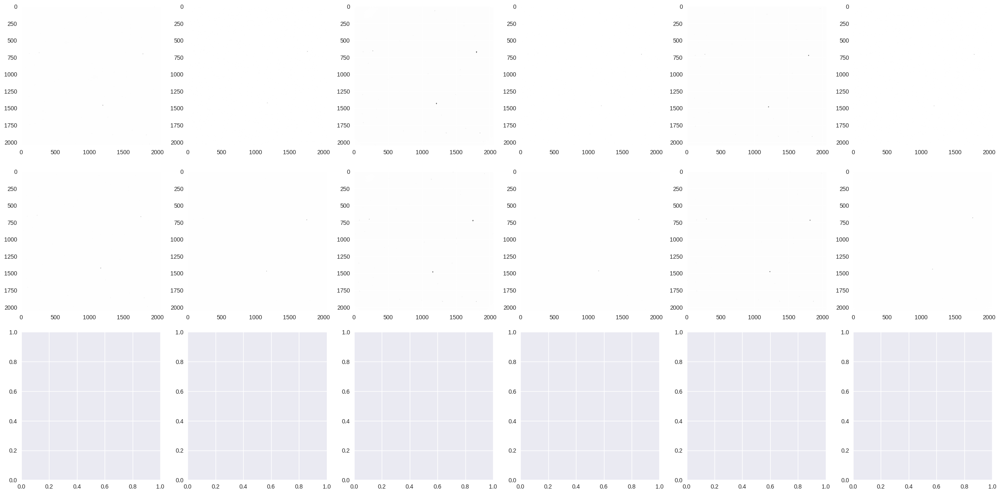

In [67]:
fig, axs = plt.subplots(3, 6, figsize=(6 * 4, 3 * 4))

for ax, path in zip(axs.flatten(), Mrk6_paths_22):
    with fits.open(path) as hdul:
        data = hdul[0].data
    ax.imshow(data)

plt.tight_layout()
plt.show()

In [68]:
### Making a little table with the properties of the thing beside it

property_dict_list = []
for path in Mrk6_paths_22:
    with fits.open(path) as hdul:
        property_dict = {}
        property_dict['IMAGETYP'] = hdul[0].header['IMAGETYP']
        property_dict['FILTER'] = hdul[0].header['FILTER']
        property_dict['EXPTIME'] = hdul[0].header['EXPTIME']
        property_dict['OBJCTRA'] = hdul[0].header['OBJCTRA']
        property_dict['OBJCTDEC'] = hdul[0].header['OBJCTDEC']
        property_dict['DATE-OBS'] = hdul[0].header['DATE-OBS']
        property_dict['JD-HELIO'] = hdul[0].header['JD-HELIO']
        property_dict['READOUTM'] = hdul[0].header['READOUTM']
        
    property_dict_list.append(property_dict)

pd.DataFrame(property_dict_list)

,IMAGETYP,FILTER,EXPTIME,OBJCTRA,OBJCTDEC,DATE-OBS,JD-HELIO,READOUTM
0,LIGHT,B,240.0,06 52 13,+74 25 30,2023-10-22T20:12:58,2.460240e+06,1MHz High Sensitivity 16-bit
1,LIGHT,Ha,300.0,06 52 11,+74 25 16,2023-10-22T20:28:15,2.460240e+06,1MHz High Sensitivity 16-bit
2,LIGHT,R,120.0,06 52 14,+74 25 19,2023-10-22T20:20:22,2.460240e+06,1MHz High Sensitivity 16-bit
3,LIGHT,SII,300.0,06 52 13,+74 25 32,2023-10-22T20:33:41,2.460240e+06,1MHz High Sensitivity 16-bit
4,LIGHT,V,150.0,06 52 13,+74 25 39,2023-10-22T20:17:25,2.460240e+06,1MHz High Sensitivity 16-bit
5,LIGHT,HaContinuum,300.0,06 52 12,+74 25 32,2023-10-22T20:22:48,2.460240e+06,1MHz High Sensitivity 16-bit
6,LIGHT,B,240.0,06 52 10,+74 25 16,2023-10-22T20:39:08,2.460240e+06,1MHz High Sensitivity 16-bit
7,LIGHT,Ha,300.0,06 52 10,+74 25 33,2023-10-22T20:54:20,2.460240e+06,1MHz High Sensitivity 16-bit
8,LIGHT,R,120.0,06 52 09,+74 25 37,2023-10-22T20:46:29,2.460240e+06,1MHz High Sensitivity 16-bit
9,LIGHT,SII,300.0,06 52 09,+74 25 31,2023-10-22T20:59:46,2.460240e+06,1MHz High Sensitivity 16-bit


We can see that all the light frames from 22-10-2023 have a readout mode of **1MHz High Sensitivity 16-bit**, while all of the calibration files except the 600s darks have a readout mode of **5MHz High Sensitivity 16-bit**. We can directly replace these files with the observations that occured on the 14-10-2023.

Will the different dates cause problems? Let's find out!

# Replacing some 22-10-2023 calibration files with 14-10-2023

We have replaced sunset biases, sunset flats in B, V, and R, scDarks, and sunset darks from 22-10-2023 with the ones from 14-10-2023. Let's confrim this:

In [69]:
data_dir_22_replaced = '/home/shoaib/APT/Final_Project/original_data/22_10_2023_replaced/'

In [70]:
bias_paths_22_replaced = sorted([data_dir_22_replaced + f for f in listdir(data_dir_22_replaced) if 'bias' in f])

property_dict_list = []
for path in bias_paths_22_replaced:
    with fits.open(path) as hdul:
        property_dict = {}
        property_dict['IMAGETYP'] = hdul[0].header['IMAGETYP']
        # property_dict['FILTER'] = hdul[0].header['FILTER']
        property_dict['EXPTIME'] = hdul[0].header['EXPTIME']
        property_dict['OBJCTRA'] = hdul[0].header['OBJCTRA']
        property_dict['OBJCTDEC'] = hdul[0].header['OBJCTDEC']
        property_dict['DATE-OBS'] = hdul[0].header['DATE-OBS']
        property_dict['JD-HELIO'] = hdul[0].header['JD-HELIO']
        property_dict['READOUTM'] = hdul[0].header['READOUTM']
        
    property_dict_list.append(property_dict)

pd.DataFrame(property_dict_list)

,IMAGETYP,EXPTIME,OBJCTRA,OBJCTDEC,DATE-OBS,JD-HELIO,READOUTM
0,BIAS,0.0,19 23 20,+38 05 39,2023-10-14T16:25:27,2.460232e+06,1MHz High Sensitivity 16-bit
1,BIAS,0.0,19 24 13,+38 05 38,2023-10-14T16:26:20,2.460232e+06,1MHz High Sensitivity 16-bit
2,BIAS,0.0,19 23 26,+38 05 39,2023-10-14T16:25:33,2.460232e+06,1MHz High Sensitivity 16-bit
3,BIAS,0.0,19 23 32,+38 05 39,2023-10-14T16:25:39,2.460232e+06,1MHz High Sensitivity 16-bit
4,BIAS,0.0,19 23 38,+38 05 39,2023-10-14T16:25:45,2.460232e+06,1MHz High Sensitivity 16-bit
5,BIAS,0.0,19 23 43,+38 05 39,2023-10-14T16:25:50,2.460232e+06,1MHz High Sensitivity 16-bit
6,BIAS,0.0,19 23 49,+38 05 38,2023-10-14T16:25:56,2.460232e+06,1MHz High Sensitivity 16-bit
7,BIAS,0.0,19 23 55,+38 05 38,2023-10-14T16:26:02,2.460232e+06,1MHz High Sensitivity 16-bit
8,BIAS,0.0,19 24 01,+38 05 38,2023-10-14T16:26:08,2.460232e+06,1MHz High Sensitivity 16-bit
9,BIAS,0.0,19 24 07,+38 05 38,2023-10-14T16:26:14,2.460232e+06,1MHz High Sensitivity 16-bit


In [71]:
flat_paths_22_replaced = sorted([data_dir_22_replaced + f for f in listdir(data_dir_22_replaced) if 'flat' in f])

property_dict_list = []
for path in flat_paths_22_replaced:
    with fits.open(path) as hdul:
        property_dict = {}
        property_dict['IMAGETYP'] = hdul[0].header['IMAGETYP']
        property_dict['FILTER'] = hdul[0].header['FILTER']
        property_dict['EXPTIME'] = hdul[0].header['EXPTIME']
        property_dict['OBJCTRA'] = hdul[0].header['OBJCTRA']
        property_dict['OBJCTDEC'] = hdul[0].header['OBJCTDEC']
        property_dict['DATE-OBS'] = hdul[0].header['DATE-OBS']
        property_dict['JD-HELIO'] = hdul[0].header['JD-HELIO']
        property_dict['READOUTM'] = hdul[0].header['READOUTM']
        
    property_dict_list.append(property_dict)

pd.DataFrame(property_dict_list)

,IMAGETYP,FILTER,EXPTIME,OBJCTRA,OBJCTDEC,DATE-OBS,JD-HELIO,READOUTM
0,FLAT,B,5.0,19 20 55,+38 05 37,2023-10-14T16:23:06,2.460232e+06,1MHz High Sensitivity 16-bit
1,FLAT,Ha,5.0,19 19 29,+38 05 41,2023-10-22T15:50:14,2.460240e+06,5MHz High Sensitivity 16-bit
2,FLAT,HaContinuum,5.0,19 18 21,+38 05 43,2023-10-22T15:49:06,2.460240e+06,5MHz High Sensitivity 16-bit
3,FLAT,R,5.0,19 17 41,+38 05 44,2023-10-14T16:19:51,2.460232e+06,1MHz High Sensitivity 16-bit
4,FLAT,SII,5.0,19 20 36,+38 05 38,2023-10-22T15:51:21,2.460240e+06,5MHz High Sensitivity 16-bit
...,...,...,...,...,...,...,...,...
43,FLAT,Ha,5.0,19 20 21,+38 05 39,2023-10-22T15:51:06,2.460240e+06,5MHz High Sensitivity 16-bit
44,FLAT,HaContinuum,5.0,19 19 13,+38 05 41,2023-10-22T15:49:58,2.460240e+06,5MHz High Sensitivity 16-bit
45,FLAT,R,5.0,19 18 56,+38 05 41,2023-10-14T16:21:07,2.460232e+06,1MHz High Sensitivity 16-bit
46,FLAT,SII,5.0,19 21 29,+38 05 37,2023-10-22T15:52:13,2.460240e+06,5MHz High Sensitivity 16-bit


In [72]:
scDark_22_replaced = sorted([data_dir_22_replaced + f for f in listdir(data_dir_22_replaced) if 'scDark' in f])

property_dict_list = []
for path in scDark_22_replaced:
    with fits.open(path) as hdul:
        property_dict = {}
        property_dict['IMAGETYP'] = hdul[0].header['IMAGETYP']
        # property_dict['FILTER'] = hdul[0].header['FILTER']
        property_dict['EXPTIME'] = hdul[0].header['EXPTIME']
        property_dict['OBJCTRA'] = hdul[0].header['OBJCTRA']
        property_dict['OBJCTDEC'] = hdul[0].header['OBJCTDEC']
        property_dict['DATE-OBS'] = hdul[0].header['DATE-OBS']
        property_dict['JD-HELIO'] = hdul[0].header['JD-HELIO']
        property_dict['READOUTM'] = hdul[0].header['READOUTM']
        
    property_dict_list.append(property_dict)

pd.DataFrame(property_dict_list)

,IMAGETYP,EXPTIME,OBJCTRA,OBJCTDEC,DATE-OBS,JD-HELIO,READOUTM
0,DARK,200.0,19 29 28,+38 05 27,2023-10-14T16:28:14,2.460232e+06,1MHz High Sensitivity 16-bit
1,DARK,200.0,20 00 25,+38 04 30,2023-10-14T16:59:08,2.460232e+06,1MHz High Sensitivity 16-bit
2,DARK,200.0,19 32 54,+38 05 21,2023-10-14T16:31:41,2.460232e+06,1MHz High Sensitivity 16-bit
3,DARK,200.0,19 36 21,+38 05 14,2023-10-14T16:35:06,2.460232e+06,1MHz High Sensitivity 16-bit
4,DARK,200.0,19 39 48,+38 05 08,2023-10-14T16:38:32,2.460232e+06,1MHz High Sensitivity 16-bit
5,DARK,200.0,19 43 13,+38 05 01,2023-10-14T16:41:58,2.460232e+06,1MHz High Sensitivity 16-bit
6,DARK,200.0,19 46 40,+38 04 55,2023-10-14T16:45:24,2.460232e+06,1MHz High Sensitivity 16-bit
7,DARK,200.0,19 50 06,+38 04 49,2023-10-14T16:48:50,2.460232e+06,1MHz High Sensitivity 16-bit
8,DARK,200.0,19 53 32,+38 04 42,2023-10-14T16:52:16,2.460232e+06,1MHz High Sensitivity 16-bit
9,DARK,200.0,19 56 58,+38 04 36,2023-10-14T16:55:42,2.460232e+06,1MHz High Sensitivity 16-bit


In [73]:
dark600_22_replaced = sorted([data_dir_22_replaced + f for f in listdir(data_dir_22_replaced) if 'dark600' in f])

property_dict_list = []
for path in dark600_22_replaced:
    with fits.open(path) as hdul:
        property_dict = {}
        property_dict['IMAGETYP'] = hdul[0].header['IMAGETYP']
        # property_dict['FILTER'] = hdul[0].header['FILTER']
        property_dict['EXPTIME'] = hdul[0].header['EXPTIME']
        # property_dict['OBJCTRA'] = hdul[0].header['OBJCTRA']
        # property_dict['OBJCTDEC'] = hdul[0].header['OBJCTDEC']
        property_dict['DATE-OBS'] = hdul[0].header['DATE-OBS']
        property_dict['JD-HELIO'] = hdul[0].header['JD-HELIO']
        property_dict['READOUTM'] = hdul[0].header['READOUTM']
        
    property_dict_list.append(property_dict)

pd.DataFrame(property_dict_list)

,IMAGETYP,EXPTIME,DATE-OBS,JD-HELIO,READOUTM
0,DARK,600.0,2023-10-23T02:31:16,2.460241e+06,1MHz High Sensitivity 16-bit
1,DARK,600.0,2023-10-23T02:41:22,2.460241e+06,1MHz High Sensitivity 16-bit
2,DARK,600.0,2023-10-23T02:51:28,2.460241e+06,1MHz High Sensitivity 16-bit
3,DARK,600.0,2023-10-23T03:01:34,2.460241e+06,1MHz High Sensitivity 16-bit
4,DARK,600.0,2023-10-23T03:11:40,2.460241e+06,1MHz High Sensitivity 16-bit
5,DARK,600.0,2023-10-23T03:21:46,2.460241e+06,1MHz High Sensitivity 16-bit
6,DARK,600.0,2023-10-23T03:31:52,2.460241e+06,1MHz High Sensitivity 16-bit
7,DARK,600.0,2023-10-23T03:41:58,2.460241e+06,1MHz High Sensitivity 16-bit
8,DARK,600.0,2023-10-23T03:52:04,2.460241e+06,1MHz High Sensitivity 16-bit
9,DARK,600.0,2023-10-23T04:02:10,2.460241e+06,1MHz High Sensitivity 16-bit


In [74]:
darkZalaz_22_replaced = sorted([data_dir_22_replaced + f for f in listdir(data_dir_22_replaced) if 'darkZalaz' in f])

property_dict_list = []
for path in darkZalaz_22_replaced:
    with fits.open(path) as hdul:
        property_dict = {}
        property_dict['IMAGETYP'] = hdul[0].header['IMAGETYP']
        # property_dict['FILTER'] = hdul[0].header['FILTER']
        property_dict['EXPTIME'] = hdul[0].header['EXPTIME']
        property_dict['OBJCTRA'] = hdul[0].header['OBJCTRA']
        property_dict['OBJCTDEC'] = hdul[0].header['OBJCTDEC']
        property_dict['DATE-OBS'] = hdul[0].header['DATE-OBS']
        property_dict['JD-HELIO'] = hdul[0].header['JD-HELIO']
        property_dict['READOUTM'] = hdul[0].header['READOUTM']
        
    property_dict_list.append(property_dict)

pd.DataFrame(property_dict_list)

,IMAGETYP,EXPTIME,OBJCTRA,OBJCTDEC,DATE-OBS,JD-HELIO,READOUTM
0,DARK,5.0,19 24 23,+38 05 37,2023-10-14T16:26:25,2.460232e+06,1MHz High Sensitivity 16-bit
1,DARK,5.0,19 26 02,+38 05 34,2023-10-14T16:28:04,2.460232e+06,1MHz High Sensitivity 16-bit
2,DARK,5.0,19 24 35,+38 05 37,2023-10-14T16:26:37,2.460232e+06,1MHz High Sensitivity 16-bit
3,DARK,5.0,19 24 46,+38 05 37,2023-10-14T16:26:48,2.460232e+06,1MHz High Sensitivity 16-bit
4,DARK,5.0,19 24 57,+38 05 36,2023-10-14T16:26:58,2.460232e+06,1MHz High Sensitivity 16-bit
5,DARK,5.0,19 25 07,+38 05 36,2023-10-14T16:27:09,2.460232e+06,1MHz High Sensitivity 16-bit
6,DARK,5.0,19 25 19,+38 05 35,2023-10-14T16:27:20,2.460232e+06,1MHz High Sensitivity 16-bit
7,DARK,5.0,19 25 29,+38 05 35,2023-10-14T16:27:31,2.460232e+06,1MHz High Sensitivity 16-bit
8,DARK,5.0,19 25 40,+38 05 35,2023-10-14T16:27:42,2.460232e+06,1MHz High Sensitivity 16-bit
9,DARK,5.0,19 25 51,+38 05 34,2023-10-14T16:27:53,2.460232e+06,1MHz High Sensitivity 16-bit


# Running the pipeline

We run the pipeline using the available instructions for basic calibration:
`python /home/data/ reduce.py -c -b -s`

And then perform astrometry:
`python /home/data/ reduce.py -a`

And then perform photometry for a range of FWHM from $1-8$ pixels:
`python /home/data/ reduce.py -a -p -l -x i` Where $i \in [1, 2 ..., 8]$
We then move these individual photometry files to a different folder `/diff_photometry/`

## Instrumental Magnitude vs. FWHM

In [75]:
target_names = ['Mrk6', 'Mrk335', 'Mrk817']
main_dir = '/home/shoaib/APT/Final_Project/22_10_2023_replaced/diff_photometry/'

In [76]:
photometry_dirs = [main_dir + file + '/' for file in listdir(main_dir) if 'photometry' in file]
photometry_dirs

['/home/shoaib/APT/Final_Project/22_10_2023_replaced/diff_photometry/x1_photometry/',
 '/home/shoaib/APT/Final_Project/22_10_2023_replaced/diff_photometry/x2_photometry/',
 '/home/shoaib/APT/Final_Project/22_10_2023_replaced/diff_photometry/x3_photometry/',
 '/home/shoaib/APT/Final_Project/22_10_2023_replaced/diff_photometry/x4_photometry/',
 '/home/shoaib/APT/Final_Project/22_10_2023_replaced/diff_photometry/x5_photometry/',
 '/home/shoaib/APT/Final_Project/22_10_2023_replaced/diff_photometry/x6_photometry/',
 '/home/shoaib/APT/Final_Project/22_10_2023_replaced/diff_photometry/x7_photometry/',
 '/home/shoaib/APT/Final_Project/22_10_2023_replaced/diff_photometry/x8_photometry/']

In [77]:
master_phot_dfs = {}
for target_name in target_names:

    photometry_dir_dict = {}
    for photometry_dir in photometry_dirs:
        photometry_dir_dict[photometry_dir.split('/')[-2].split('_')[0] + '_path'] = photometry_dir + f'{target_name}_photometry.txt'
        df = pd.read_csv(photometry_dir + f'{target_name}_photometry.txt', sep='\s+')
        df.sort_values(by=['FILTER', 'FILENAME'], inplace=True, ignore_index=True)
        photometry_dir_dict[photometry_dir.split('/')[-2].split('_')[0] + '_df'] = df


    master_phot_dfs[target_name] = photometry_dir_dict

In [78]:
master_phot_dfs['Mrk335']['x1_df']

,FILENAME,MJD-HELIO,FILTER,DATE-OBS,FWHM,RAJ2000,DECJ2000,xpix,ypix,flag,flag_p,flux_peak,flux,mag,mag_err
0,./astrometry/Mrk335-0001_B_cal_wcs.fit,60239.77555422578,B,2023-10-22T18:27:21,1.0,1.5814245344579048,20.202982784084693,1062.2214573544381,994.4728005692748,0,1,6968.9541015625,114757.81566126063,-12.649455682864637,0.0036027034167542896
1,./astrometry/Mrk335-0002_B_cal_wcs.fit,60239.793504868634,B,2023-10-22T18:53:12,1.0,1.5814128653623398,20.202978326286836,1044.691083609716,991.5078155812796,0,1,9183.1171875,141368.61762658448,-12.875882528173747,0.003158577457789785
2,./astrometry/Mrk335-0003_B_cal_wcs.fit,60239.81152529828,B,2023-10-22T19:19:09,1.0,1.5814484010579954,20.202952233486677,1056.8939864340316,981.8118592506593,0,1,8066.12255859375,125537.14059340945,-12.74693058084714,0.003373821746195555
3,FILENAME,MJD-HELIO,FILTER,DATE-OBS,FWHM,RAJ2000,DECJ2000,xpix,ypix,flag,flag_p,flux_peak,flux,mag,mag_err
4,FILENAME,MJD-HELIO,FILTER,DATE-OBS,FWHM,RAJ2000,DECJ2000,xpix,ypix,flag,flag_p,flux_peak,flux,mag,mag_err
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20,./astrometry/Mrk335-0002_SII_cal_wcs.fit,60239.808157327585,SII,2023-10-22T19:13:48,1.0,1.5814230305010322,20.202964961304513,1063.3394449594782,996.7869167203817,0,1,13424.1171875,201919.00011909445,-13.26294296747593,0.0024458542347121246
21,./astrometry/Mrk335-0003_SII_cal_wcs.fit,60239.8260733909,SII,2023-10-22T19:39:36,1.0,1.5814259704513391,20.20296060768911,1047.9397113266418,1016.0914814911843,0,1,9911.5546875,170766.20254979917,-13.08100480202792,0.002666317034560693
22,./astrometry/Mrk335-0001_V_cal_wcs.fit,60239.77805400966,V,2023-10-22T18:31:42,1.0,1.5814051727022629,20.202964484763083,1033.9797884188192,972.6984972849949,0,1,10292.232421875,172224.06269478635,-13.090234574610111,0.003034406235965037
23,./astrometry/Mrk335-0002_V_cal_wcs.fit,60239.796062858775,V,2023-10-22T18:57:38,1.0,1.5814419593544606,20.202988060802895,1092.2839829387945,961.5326819036899,0,1,15049.802734375,219273.35084650546,-13.352464633416641,0.00258510236949074


In [79]:
for target_name, target_name_dict in master_phot_dfs.items():
    for xFWHM, master_phot_df in target_name_dict.items():
        if 'df' in xFWHM:
            master_phot_dfs[target_name][xFWHM] = master_phot_df.query("FILENAME != 'FILENAME'").reset_index(drop=True)

In [80]:
master_phot_dfs['Mrk817']['x5_df']

,FILENAME,MJD-HELIO,FILTER,DATE-OBS,FWHM,RAJ2000,DECJ2000,xpix,ypix,flag,flag_p,flux_peak,flux,mag,mag_err
0,./astrometry/Mrk817-0001_B_cal_wcs.fit,60239.717182,B,2023-10-22T17:14:00,5.0,219.092121,58.794305,1007.410249,974.114709,0,0,8040.461426,411610.130041,-14.036215,0.002965
1,./astrometry/Mrk817-0002_B_cal_wcs.fit,60239.732818,B,2023-10-22T17:36:31,5.0,219.092139,58.794323,1016.707800,944.221776,0,0,9489.100586,399316.226638,-14.003292,0.003123
2,./astrometry/Mrk817-0003_B_cal_wcs.fit,60239.748398,B,2023-10-22T17:58:57,5.0,219.092211,58.794310,1030.203476,931.357247,0,0,7187.153320,369579.982521,-13.919271,0.003384
3,./astrometry/Mrk817-0001_Ha_cal_wcs.fit,60239.726384,Ha,2023-10-22T17:26:45,5.0,219.092121,58.794316,993.306910,997.620938,0,0,1793.703369,70826.290041,-12.125486,0.007344
4,./astrometry/Mrk817-0002_Ha_cal_wcs.fit,60239.741928,Ha,2023-10-22T17:49:08,5.0,219.092101,58.794322,1053.687344,949.699918,0,0,1317.621094,68607.241281,-12.090925,0.007506
5,./astrometry/Mrk817-0003_Ha_cal_wcs.fit,60239.757553,Ha,2023-10-22T18:11:38,5.0,219.092195,58.794298,1043.924742,976.294185,0,0,1635.379761,67089.533761,-12.066637,0.007906
6,./astrometry/Mrk817-0001_cnt_cal_wcs.fit,60239.722946,HaContinuum,2023-10-22T17:21:18,5.0,219.092131,58.794332,1039.374253,955.709002,0,0,1626.028320,72739.075747,-12.154419,0.007223
7,./astrometry/Mrk817-0002_cnt_cal_wcs.fit,60239.738514,HaContinuum,2023-10-22T17:43:43,5.0,219.092219,58.794285,989.868003,999.702566,0,0,1595.332275,72145.498833,-12.145523,0.007456
8,./astrometry/Mrk817-0003_cnt_cal_wcs.fit,60239.754115,HaContinuum,2023-10-22T18:06:11,5.0,219.092067,58.794276,1003.520859,931.034403,0,0,1485.673706,69725.802733,-12.108484,0.007699
9,./astrometry/Mrk817-0001_R_cal_wcs.fit,60239.720388,R,2023-10-22T17:19:22,5.0,219.091932,58.794353,1007.889083,1012.467585,0,0,18994.287109,761834.644672,-14.704652,0.002287


In [81]:
def error_on_mean(errors): return np.sqrt(np.sum(np.square(errors))) / len(errors)

def return_fiter_magnitudes(target_master_phot_dfs):
    df = pd.concat(target_master_phot_dfs)
    df['mag'] = pd.to_numeric(df['mag'])
    df['mag_err'] = pd.to_numeric(df['mag_err'])

    target_dict = {}
    
    filter_grouped = df.groupby(by='FILTER', observed=True)
    for filter_name, filter_df in filter_grouped:
        fwhms = []
        filter_mags = []
        filter_mag_errs = []

        fwhmm_grouped = filter_df.groupby(by='FWHM', observed=True, sort=False)
        for fwhm, fwhm_filter_df in fwhmm_grouped:
            fwhms.append(fwhm)
            filter_mags.append(np.mean(fwhm_filter_df['mag'].to_numpy()))
            filter_mag_errs.append(error_on_mean(fwhm_filter_df['mag_err'].to_numpy()))

        target_dict[filter_name] = np.column_stack([fwhms, filter_mags, filter_mag_errs])
        
    return target_dict

### Now we plot

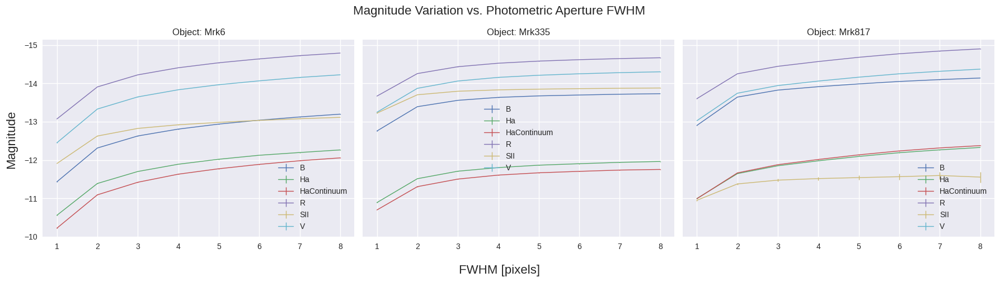

In [82]:
nrows, ncols = 1, 3

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6 * ncols, 5 * nrows), sharey=True)

for target_name, ax in zip(master_phot_dfs, axs):
    target_dict = return_fiter_magnitudes([master_phot_dfs[target_name][f'x{i}_df'] for i in range(1, 9)])

    for filter_name, array in target_dict.items():
        fwhms, mags, magerrs = array[:, 0].astype(float), array[:, 1].astype(float), array[:, 2].astype(float)
        ax.errorbar(fwhms, mags, yerr=magerrs, label=f'{filter_name}', linewidth=1)
        ax.yaxis.set_inverted(True)
        ax.set_title(f'Object: {target_name}')
        ax.legend()

fig.supylabel('Magnitude', size=16, x=0.01)
fig.supxlabel('FWHM [pixels]', size=16)
fig.suptitle('Magnitude Variation vs. Photometric Aperture FWHM', size=16)

plt.tight_layout()

# Absolute Photometric Calibration

### Let's lay out details for the MRK 6 companion stars

The following are the companion stars of MRK 6. The list numbers corresponding to each object is how they are represented in the `Mrk6_stars.txt` file.

- **MRK 6**
    - sexagesimal coordinates: 06 52 12.3346265592 +74 25 37.121227716
    - deg: 103.051394 degrees, 74.426978 degrees

1) GSC 04371-00800
    - sexagesimal: 06 52 48.4284781728 +74 20 10.723339428
    - deg: 103.201785 degrees, 74.336312 degrees

2) GSC 04371-00113
    - sexagesimal: 06 51 54.3198558360 +74 21 37.668392640
    - deg: 102.976333 degrees, 74.360463 degrees

3) TYC 4371-867-1
    - sexagesimal: 06 52 01.0240519680 +74 22 46.011628488
    - deg: 103.004267 degrees, 74.379448 degrees

4) TYC 4371-167-1
    - sexagesimal: 06 51 02.6358682920 +74 27 37.736164476
    - deg: 102.760983 degrees, 74.460482 degrees

In [83]:
!cat /home/shoaib/APT/Final_Project/22_10_2023_replaced/Mrk6_stars.txt

103.051394 74.426978 Mrk6
103.201785 74.336312 1
102.976333 74.360463 2
103.004267 74.379448 3
102.760983 74.460482 4

In [84]:
### Looking at the simbad columns available to us

np.array(Simbad.list_votable_fields()[["name", "description"]]['name'])

array(['mesDiameter', 'mesPM', 'mesISO', 'mesSpT', 'allfluxes', 'ident',
       'flux', 'mesOtype', 'mesPLX', 'otypedef', 'mesDistance', 'otypes',
       'mesVar', 'mesXmm', 'mesVelocities', 'has_ref', 'mesRot', 'biblio',
       'ids', 'mesHerschel', 'mesIUE', 'mesFe_h', 'alltypes', 'basic',
       'dec', 'main_id', 'otype_txt', 'ra', 'coo_bibcode',
       'coo_err_angle', 'coo_err_maj', 'coo_err_maj_prec', 'coo_err_min',
       'coo_err_min_prec', 'coo_qual', 'coo_wavelength', 'dec_prec',
       'galdim_angle', 'galdim_bibcode', 'galdim_majaxis',
       'galdim_majaxis_prec', 'galdim_minaxis', 'galdim_minaxis_prec',
       'galdim_qual', 'galdim_wavelength', 'hpx', 'morph_bibcode',
       'morph_qual', 'morph_type', 'nbref', 'oid', 'otype', 'plx_bibcode',
       'plx_err', 'plx_err_prec', 'plx_prec', 'plx_qual', 'plx_value',
       'pm_bibcode', 'pm_err_angle', 'pm_err_maj', 'pm_err_maj_prec',
       'pm_err_min', 'pm_err_min_prec', 'pm_qual', 'pmdec', 'pmdec_prec',
       'pmra', 'pm

We do have B, V, and R columns. We'll use those.

In [85]:
mrk6_companions = ["MRK 6", "GSC 04371-00800", "GSC 04371-00113", "TYC 4371-867-1", "TYC 4371-167-1"]

simbad = Simbad()
simbad.add_votable_fields("B", "V", "R")
result_table = simbad.query_objects(mrk6_companions)
result_table

main_id,ra,dec,coo_err_maj,coo_err_min,coo_err_angle,coo_wavelength,coo_bibcode,V,R,B,user_specified_id,object_number_id
,deg,deg,mas,mas,deg,,,,,,,
object,float64,float64,float32,float32,int16,str1,object,float64,float64,float64,object,int64
IC 450,103.05139427733,74.42697811881,0.0131,0.0172,90,O,2020yCat.1350....0G,14.1899995803833,--,15.15999984741211,MRK 6,1
GSC 04371-00800,103.20178532572001,74.33631203873,0.0114,0.0146,90,O,2020yCat.1350....0G,14.569999694824219,--,15.239999771118164,GSC 04371-00800,2
GSC 04371-00113,102.97633273265,74.3604634424,0.0116,0.014,90,O,2020yCat.1350....0G,14.4399995803833,14.329999923706055,15.0600004196167,GSC 04371-00113,3
TYC 4371-867-1,103.0042668832,74.37944767458,0.0078,0.0097,90,O,2020yCat.1350....0G,11.15999984741211,--,12.069999694824219,TYC 4371-867-1,4
TYC 4371-167-1,102.76098278455001,74.46048226791,0.0134,0.0167,90,O,2020yCat.1350....0G,11.319999694824219,--,12.8100004196167,TYC 4371-167-1,5


We only reliably have the B and V magnitudes for all objects, so we'll use those.

In [86]:
result_table = result_table.to_pandas()[["main_id", "user_specified_id", "object_number_id", "B", "V"]]
result_table['object_number_id'] = ['T', 'C1', 'C2', 'C3', 'C4']
result_table

,main_id,user_specified_id,object_number_id,B,V
0,IC 450,MRK 6,T,15.16,14.19
1,GSC 04371-00800,GSC 04371-00800,C1,15.24,14.57
2,GSC 04371-00113,GSC 04371-00113,C2,15.06,14.44
3,TYC 4371-867-1,TYC 4371-867-1,C3,12.07,11.16
4,TYC 4371-167-1,TYC 4371-167-1,C4,12.81,11.32


In [87]:
filter_dict_list = []

for filter in ['B', 'V']:
    filter_dict = {'FILTER': filter}
    for i in range(1, 5):
        filter_dict[f"{result_table.iloc[i]['object_number_id']}"] = result_table.iloc[i][filter]
    filter_dict_list.append(filter_dict)

In [88]:
companion_df = pd.DataFrame(filter_dict_list)
companion_df

,FILTER,C1,C2,C3,C4
0,B,15.24,15.06,12.07,12.81
1,V,14.57,14.44,11.16,11.32


### Let's read our MRK 6 photometry file 

In [89]:
main_dir = '/home/shoaib/APT/Final_Project/22_10_2023_replaced/'
main_phot_file = 'Mrk6_photometry.txt'

In [90]:
mrk_6_master_photometry = pd.read_csv(main_dir + main_phot_file, sep='\s+')
mrk_6_master_photometry = mrk_6_master_photometry[np.insert(mrk_6_master_photometry.columns[5:9], 0, mrk_6_master_photometry.columns[2])]
mrk_6_master_photometry

,FILTER,TmC1,TmC2,TmC3,TmC4
0,Ha,-0.024830,0.048134,3.462960,3.724706
1,SII,-1.186392,-1.100109,2.300112,2.569258
2,HaContinuum,0.229930,0.307413,3.680920,3.926610
3,R,0.062001,0.151342,3.032701,3.170580
4,B,0.706347,0.885981,3.554198,3.133908
5,HaContinuum,0.235247,0.314684,3.678985,3.926845
6,V,0.326093,0.446512,3.320485,3.309032
7,SII,-1.184378,-1.102371,2.298041,2.573270
8,Ha,-0.054330,0.024827,3.451931,3.702438
9,B,0.708521,0.885455,3.544730,3.143518


In [91]:
mrk_6_master_photometry = mrk_6_master_photometry.query("FILTER in ['B', 'V']")
mrk_6_master_photometry

,FILTER,TmC1,TmC2,TmC3,TmC4
4,B,0.706347,0.885981,3.554198,3.133908
6,V,0.326093,0.446512,3.320485,3.309032
9,B,0.708521,0.885455,3.544730,3.143518
10,V,0.328918,0.442242,3.257532,3.253784


In [92]:
mrk_6_master_photometry = mrk_6_master_photometry.groupby('FILTER', as_index=False).mean()
mrk_6_master_photometry

,FILTER,TmC1,TmC2,TmC3,TmC4
0,B,0.707434,0.885718,3.549464,3.138713
1,V,0.327505,0.444377,3.289008,3.281408


In [93]:
mrk6_Bmag = (mrk_6_master_photometry.to_numpy()[0][1:] + companion_df.to_numpy()[0][1:]).mean()
mrk6_Vmag = (mrk_6_master_photometry.to_numpy()[1][1:] + companion_df.to_numpy()[1][1:]).mean()

print(f'The B band magnitude of Mrk 6 is {mrk6_Bmag:.3f}')
print(f'The V band magnitude of Mrk 6 is {mrk6_Vmag:.3f}')

The B band magnitude of Mrk 6 is 15.865
The V band magnitude of Mrk 6 is 14.708


This is reasonably close to the reported 14.19 V band magnitude.